# Финальный проект - Прогнозирование оттока клиентов оператора связи 
<a id='head'></a>

## Описание проекта

Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его сотрудники начнут предлагать промокоды и специальные условия всем, кто планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей, «ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент договор. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и услугах. 

Задача: обучить модель на предоставленных данных для прогноза оттока клиентов.

Ссылка на kaggle: https://www.kaggle.com/code/denisur/final-project-telecom

In [ ]:
#!pip install --upgrade scikit-learn -q
#!pip install --upgrade shap -q
!pip install phik -q
!pip install shap -q
!pip install --upgrade scikit-learn -q
!pip install catboost -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 69.0 MB/s eta 0:00:00:00:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
category-encoders 2.7.0 requires scikit-learn<1.6.0,>=1.0.0, but you have scikit-learn 1.6.1 which is incompatible.
bigframes 1.36.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.


In [2]:
import pandas as pd

import numpy as np

import seaborn as sns

import matplotlib
from matplotlib import pyplot as plt

import scipy.stats as stats
from scipy.stats import shapiro

from sklearn.model_selection import (train_test_split,
                                     RandomizedSearchCV,
                                     StratifiedKFold)                                     
from sklearn.ensemble import RandomForestClassifier                                 
from sklearn.metrics import (confusion_matrix,
                             ConfusionMatrixDisplay,
                             roc_curve,
                             roc_auc_score,
                            accuracy_score,
                            recall_score,
                            precision_score,
                            f1_score)                                                   
from sklearn.preprocessing import (OneHotEncoder, 
                                   StandardScaler, 
                                   MinMaxScaler, 
                                   RobustScaler
                                  )
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier

from catboost import CatBoostClassifier
from catboost.utils import get_gpu_device_count

import torch
import torch.nn as nn

from sqlalchemy import create_engine, MetaData
                                     
import os
import warnings
import re
import phik
import shap
import random

from tqdm import tqdm
from tqdm import notebook

warnings.filterwarnings("ignore")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

tqdm.pandas()

pd.set_option('display.max_columns', None)

sns.set(rc={'figure.figsize':(10, 8)})

RANDOM_STATE = 230425
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
#torch.use_deterministic_algorithms(True)

TEST_SIZE = 0.25

DATA_PATH = '/kaggle/input/ds-plus-final/'

## Набор функций

In [3]:
def numeric_analysis(df, column, annot):
    # выводим таблицу со статистикой и считаем усы боксплота
    stat = df[column].describe()
    print(stat)
    up_whisker = stat['75%'] + 1.5 * (stat['75%'] - stat['25%'])
    low_whisker = stat['25%'] - 1.5 * (stat['75%'] - stat['25%'])

    print(f'\nВерхний ус: {round(up_whisker, 2)} \nНижний ус: {round(low_whisker, 2)} \
    \nМедианное значение: {df[column].median()}')

    # строим ящик с усами и гистограмму признака
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
    sns.boxplot(df[column], orient="h", ax=ax_box)
    sns.histplot(data=df, x=column, ax=ax_hist, bins=100, kde=True, hue='target', stat='density', common_norm=False)
    plt.axvline(df[column].mean(), color='r', linestyle='-', label=f'Среднее значение: {round(df[column].mean(), 2)}')
    plt.axvline(df[column].median(), color='g', linestyle='--', label=f'Медианное значение: {round(df[column].median(), 2)}')
    ax_box.set(xlabel='')
    
    ax_hist.legend(loc='best')
    
    ax_box.set_title(f'График распределения {annot}', weight='bold')
    
    plt.show()

In [4]:
def cat_vis(df, cat, target=None):
    sns.countplot(
        y=cat,
        data=df,
        hue=target,
        orient='h'
    )
    plt.title(f'График распределения {cat}', weight='bold')
    plt.xlabel('Количество')
    plt.xticks(rotation=45)
    plt.show()
    return df[cat].value_counts()

In [5]:
def fin_analysis(df, columns, values):
    fin_pivot = pd.pivot_table(df, 
                   index=columns,
                   columns='target',
                   values=values,
                   aggfunc='mean')
    return fin_pivot

## Подключение к базе данных

In [6]:
db_path = os.path.join(DATA_PATH, 'ds-plus-final.db')
engine = create_engine(f'sqlite:///{db_path}', echo=False)

In [7]:
engine

Engine(sqlite:////kaggle/input/ds-plus-final/ds-plus-final.db)

In [8]:
metadata = MetaData()

metadata.reflect(bind=engine)
metadata.tables.keys()

dict_keys(['contract', 'data_arc', 'data_bulk', 'data_bulk_time', 'data_gas', 'data_temp', 'data_wire', 'data_wire_time', 'internet', 'personal', 'phone'])

In [9]:
metadata = MetaData()

metadata.reflect(bind=engine)
existing_tables = metadata.tables.keys()

# Проверка наличия таблиц
tables_to_check = ['contract', 'personal', 'internet', 'phone']

for table in tables_to_check:
    if table in existing_tables:
        print(f"Таблица '{table}' существует.")
    else:
        print(f"Таблица '{table}' не существует.")

Таблица 'contract' существует.
Таблица 'personal' существует.
Таблица 'internet' существует.
Таблица 'phone' существует.


In [10]:
contract_q = '''SELECT * FROM contract'''
personal_q = '''SELECT * FROM personal'''
internet_q = '''SELECT * FROM internet'''
phone_q = '''SELECT * FROM phone'''

## Исследование данных

### Договора

In [11]:
сontract_df = pd.read_sql_query(contract_q, con = engine)

`contract` — информация о договорах;
* customerID — ID абонента;
* BeginDate — дата начала действия договора;
* EndDate — дата окончания действия договора;
* Type — тип оплаты: раз в год-два или ежемесячно;
* PaperlessBilling — электронный расчётный лист;
* PaymentMethod — тип платежа;
* MonthlyCharges — расходы за месяц;
* TotalCharges — общие расходы абонента.


In [12]:
сontract_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        7043 non-null   object
 1   BeginDate         7043 non-null   object
 2   EndDate           7043 non-null   object
 3   Type              7043 non-null   object
 4   PaperlessBilling  7043 non-null   object
 5   PaymentMethod     7043 non-null   object
 6   MonthlyCharges    7043 non-null   object
 7   TotalCharges      7043 non-null   object
dtypes: object(8)
memory usage: 440.3+ KB


In [13]:
сontract_df.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.3,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.7,353.5


In [14]:
сontract_df['MonthlyCharges'] = сontract_df['MonthlyCharges'].astype('float')

In [15]:
сontract_df[сontract_df['TotalCharges'] == ' '].count()

customerID          11
BeginDate           11
EndDate             11
Type                11
PaperlessBilling    11
PaymentMethod       11
MonthlyCharges      11
TotalCharges        11
dtype: int64

Всего 11 записей с пустым значением признака. Посмотрим, чем похожи абоненты.

In [16]:
сontract_df[сontract_df['TotalCharges'] == ' ']

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
488,4472-LVYGI,2020-02-01,No,Two year,Yes,Bank transfer (automatic),52.55,
753,3115-CZMZD,2020-02-01,No,Two year,No,Mailed check,20.25,
936,5709-LVOEQ,2020-02-01,No,Two year,No,Mailed check,80.85,
1082,4367-NUYAO,2020-02-01,No,Two year,No,Mailed check,25.75,
1340,1371-DWPAZ,2020-02-01,No,Two year,No,Credit card (automatic),56.05,
3331,7644-OMVMY,2020-02-01,No,Two year,No,Mailed check,19.85,
3826,3213-VVOLG,2020-02-01,No,Two year,No,Mailed check,25.35,
4380,2520-SGTTA,2020-02-01,No,Two year,No,Mailed check,20.00,
5218,2923-ARZLG,2020-02-01,No,One year,Yes,Mailed check,19.70,
6670,4075-WKNIU,2020-02-01,No,Two year,No,Mailed check,73.35,


Пользователей с пропуском в признаке TotalCharges объединяет то, что все заключенные контракты имеют дату актуальности всей базы данных. По сути по данным абонентам нет статистики.
    
У нас два варианта заполнения пропуска: 
1. Проставить нули 
2. Проставить значения ежемесяных платежей.
    
Считаю, что можно взять ежемесяный платеж.

In [17]:
сontract_df['TotalCharges'] = сontract_df.progress_apply(lambda x: 
                                                         x['MonthlyCharges'] if x['TotalCharges']==' ' 
                                                         else x['TotalCharges'],
                                                        axis=1)

100%|██████████| 7043/7043 [00:00<00:00, 143154.40it/s]


In [18]:
сontract_df['TotalCharges'] = сontract_df['TotalCharges'].astype('float')

In [19]:
сontract_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   float64
dtypes: float64(2), object(6)
memory usage: 440.3+ KB


In [20]:
сontract_df.customerID.duplicated().sum()

0

Признак EndDate является целевым. Конвертируем его в бинарный. 
0 - не разорван контракт
1 - разорван контракт

In [21]:
сontract_df['target'] = сontract_df['EndDate'].progress_apply(lambda x: 0 if x=='No' else 1)

100%|██████████| 7043/7043 [00:00<00:00, 1087006.29it/s]


In [22]:
сontract_df['contract_end_date'] = сontract_df['EndDate'].progress_apply(lambda x: 
                                                                         pd.to_datetime('2020-03-01') if x=='No' 
                                                                         else  pd.to_datetime(x))

100%|██████████| 7043/7043 [00:02<00:00, 3135.13it/s]


In [23]:
сontract_df['contract_end_date'].value_counts()

contract_end_date
2020-03-01    5942
2020-01-01      39
2019-12-01      38
2018-11-01      35
2019-09-01      32
              ... 
2015-04-01       2
2014-12-01       2
2014-10-01       1
2014-06-01       1
2014-11-01       1
Name: count, Length: 67, dtype: int64

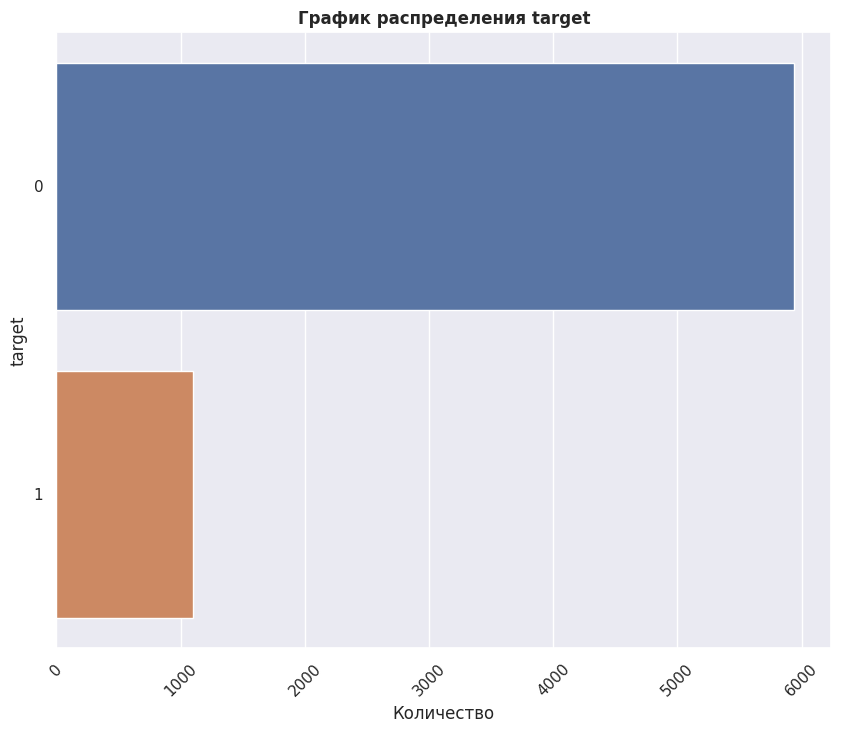

target
0    5942
1    1101
Name: count, dtype: int64

In [24]:
cat_vis(сontract_df, 'target')

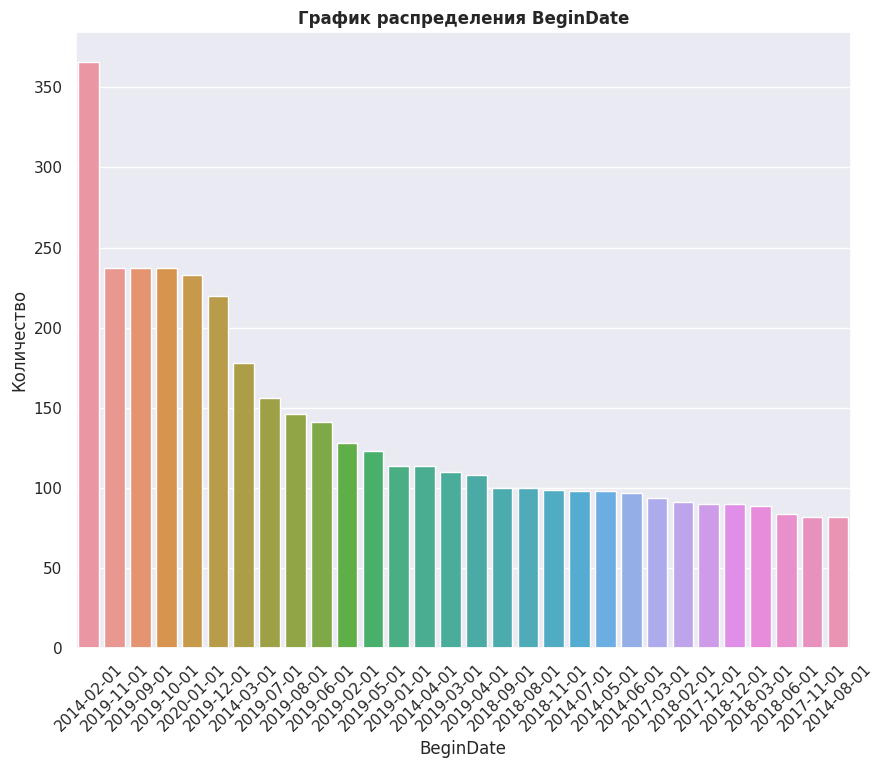

In [25]:
sns.barplot(y=сontract_df.BeginDate.value_counts().head(30),
            x=сontract_df.BeginDate.value_counts().head(30).index)
plt.title(f'График распределения BeginDate', weight='bold')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.show()

Большое кол-во абонентов подключилось в феврале 2014 году. Скорее всего в этом году компания вышла на рынок.
Копнем глубже и посмотрим распределение по годам и месяцам.

In [26]:
сontract_df['BeginDate'] = pd.to_datetime(сontract_df['BeginDate'])

In [27]:
сontract_df['contract_duration'] = (сontract_df['contract_end_date'] - сontract_df['BeginDate']).dt.days

In [28]:
сontract_df['contract_duration'].value_counts()

contract_duration
2220    265
121     238
182     237
152     236
60      233
       ... 
336       1
1704      1
30        1
1311      1
2129      1
Name: count, Length: 256, dtype: int64

In [29]:
сontract_df['begin_year'] = сontract_df['BeginDate'].dt.year
сontract_df['begin_month'] = сontract_df['BeginDate'].dt.month
сontract_df['begin_day'] = сontract_df['BeginDate'].dt.day
сontract_df['begin_weekday'] = сontract_df['BeginDate'].dt.weekday
сontract_df['begin_dayofyear'] = сontract_df['BeginDate'].dt.dayofyear

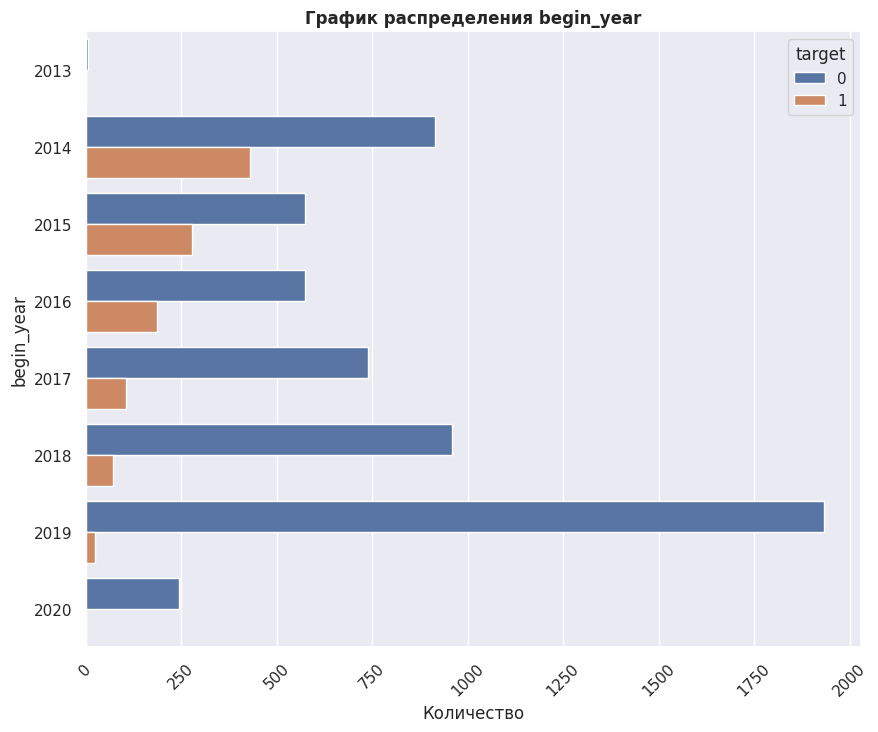

begin_year
2019    1957
2014    1344
2018    1030
2015     852
2017     845
2016     763
2020     244
2013       8
Name: count, dtype: int64

In [30]:
cat_vis(сontract_df, 'begin_year', 'target')

2013 и 2020 год имеют низкое кол-во подключенных абонентов. Считаю, что данные за эти года можно оставить, так как они не сильно исказят анализ.


In [31]:
fin_analysis(сontract_df, 'begin_year', 'TotalCharges')

target,0,1
begin_year,,
2013,7904.428333,2142.560000
2014,5307.813567,2971.071023
2015,3924.784564,2586.576187
2016,2935.419809,1974.244734
2017,2077.680568,1595.531038
2018,1201.616086,857.932361
2019,389.330202,316.684400
2020,39.003566,NaN


In [32]:
сontract_df[сontract_df['begin_year'] == 2013]

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,target,contract_end_date,contract_duration,begin_year,begin_month,begin_day,begin_weekday,begin_dayofyear
975,2834-JRTUA,2013-11-01,No,Two year,Yes,Electronic check,108.05,8184.79,0,2020-03-01,2312,2013,11,1,4,305
3040,7317-GGVPB,2013-11-01,No,Two year,Yes,Credit card (automatic),108.60,8145.00,0,2020-03-01,2312,2013,11,1,4,305
3439,0917-EZOLA,2013-10-01,No,Two year,Yes,Bank transfer (automatic),104.15,7915.40,0,2020-03-01,2343,2013,10,1,1,274
4513,8580-QVLOC,2013-10-01,No,Two year,No,Credit card (automatic),92.45,7026.20,0,2020-03-01,2343,2013,10,1,1,274
4610,2889-FPWRM,2013-10-01,No,One year,Yes,Bank transfer (automatic),117.80,9221.38,0,2020-03-01,2343,2013,10,1,1,274
5441,3512-IZIKN,2013-12-01,2017-10-01,Two year,No,Credit card (automatic),65.30,3003.80,1,2017-10-01,1400,2013,12,1,6,335
6038,1555-DJEQW,2013-12-01,2014-11-01,Two year,Yes,Bank transfer (automatic),114.20,1281.32,1,2014-11-01,335,2013,12,1,6,335
6290,2530-ENDWQ,2013-12-01,No,Two year,Yes,Bank transfer (automatic),93.70,6933.80,0,2020-03-01,2282,2013,12,1,6,335


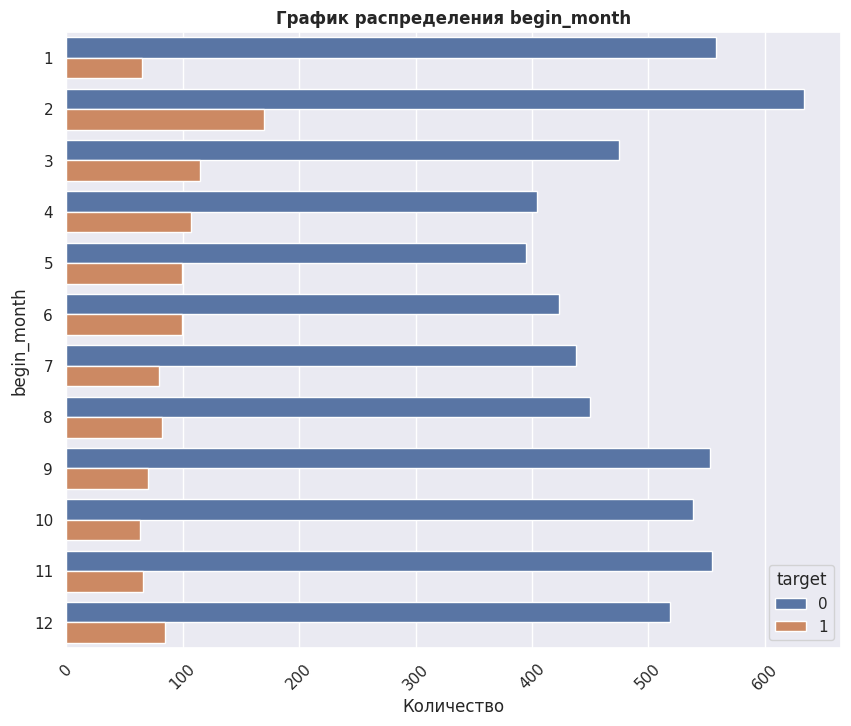

begin_month
2     804
1     623
9     623
11    621
12    604
10    601
3     590
8     532
6     522
7     518
4     511
5     494
Name: count, dtype: int64

In [33]:
cat_vis(сontract_df, 'begin_month', 'target')

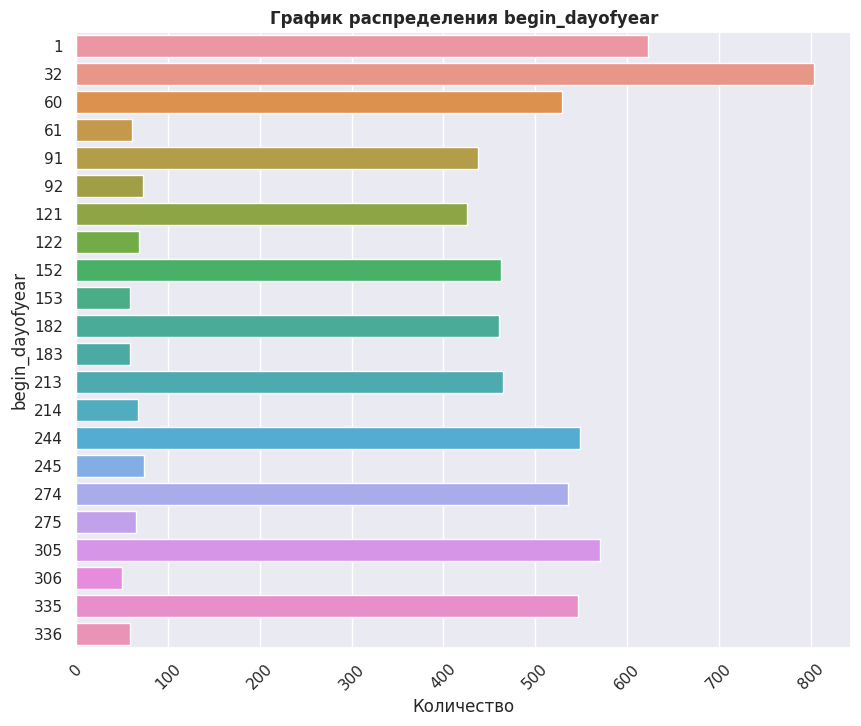

begin_dayofyear
32     804
1      623
305    571
244    549
335    546
274    536
60     529
213    465
152    463
182    460
91     438
121    426
245     74
92      73
122     68
214     67
275     65
61      61
153     59
183     58
336     58
306     50
Name: count, dtype: int64

In [34]:
cat_vis(сontract_df, 'begin_dayofyear')

Можно видеть закономерность, что контракты начинают действовать в первый день месяца.

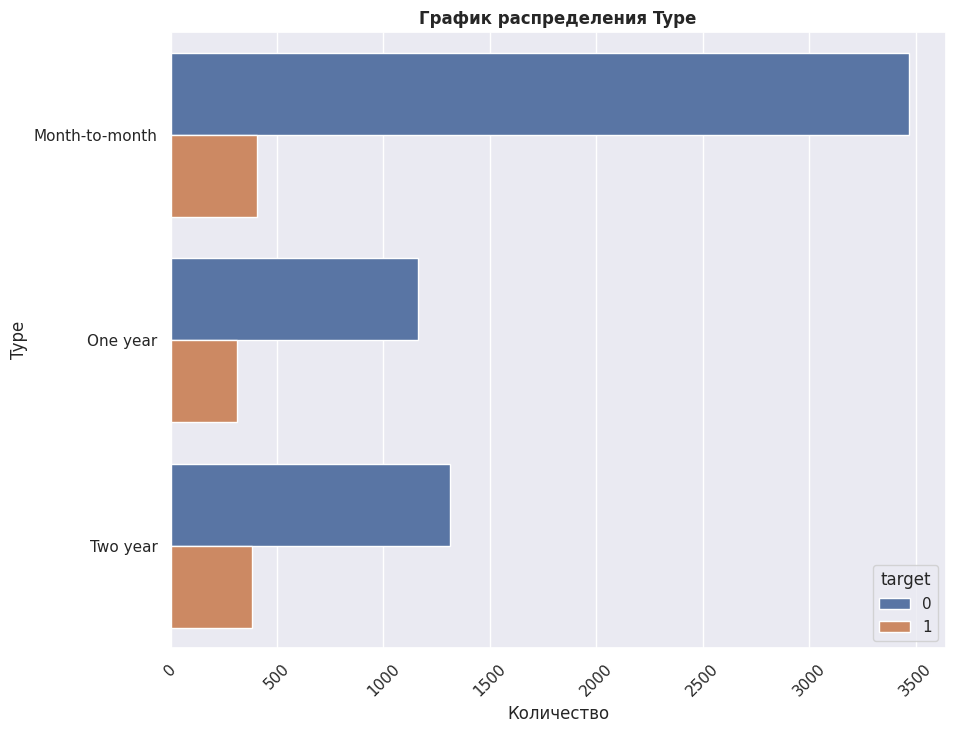

Type
Month-to-month    3875
Two year          1695
One year          1473
Name: count, dtype: int64

In [35]:
cat_vis(сontract_df, 'Type', 'target')

Кол-во ушедших абонентов примерно равно в каждом из типов срока оплаты.

In [36]:
fin_analysis(сontract_df, 'Type', 'MonthlyCharges')

target,0,1
Type,,
Month-to-month,64.342215,83.919779
One year,61.942543,76.559904
Two year,59.321385,65.767848


In [37]:
83/64, 76/62, 65/59

(1.296875, 1.2258064516129032, 1.1016949152542372)

* Ушедшие клиенты в среднем ежемесячно тратят больше.
* Пользователи, которые остались, платят значительно меньше ушедших (~25%), так как могли получить скидку в рамках программы по удержанию клиентов.
* Клиенты с планом на 2 года платят меньше, так как скорее всего получают скидку за "объем".

In [38]:
fin_analysis(сontract_df, 'Type', 'TotalCharges')

target,0,1
Type,,
Month-to-month,1229.584005,2160.691867
One year,2805.071026,2520.254601
Two year,3629.861606,2474.134121


In [39]:
2160/1229, 1972/647

(1.757526444263629, 3.047913446676971)

* Если смотреть на общие расходы пользователей с ежемесячной оплатой, то средние траты ушедших на 75% выше, а медианные в 3 раза.

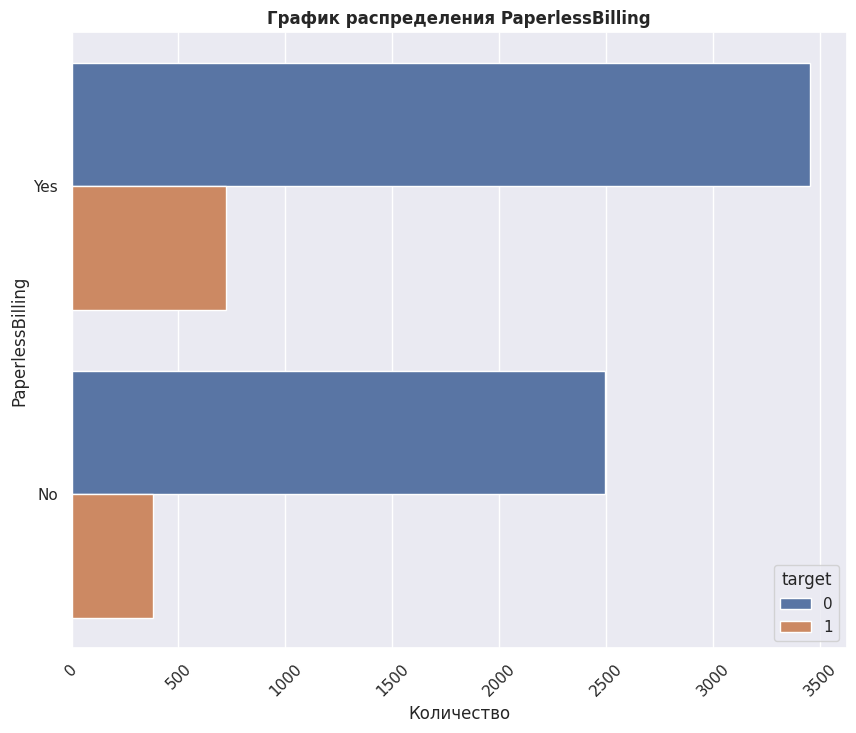

PaperlessBilling
Yes    4171
No     2872
Name: count, dtype: int64

In [40]:
cat_vis(сontract_df, 'PaperlessBilling', 'target')

count    7043.000000
mean      923.022292
std       683.037086
min        28.000000
25%       305.000000
50%       790.000000
75%      1461.000000
max      2343.000000
Name: contract_duration, dtype: float64

Верхний ус: 3195.0 
Нижний ус: -1429.0     
Медианное значение: 790.0


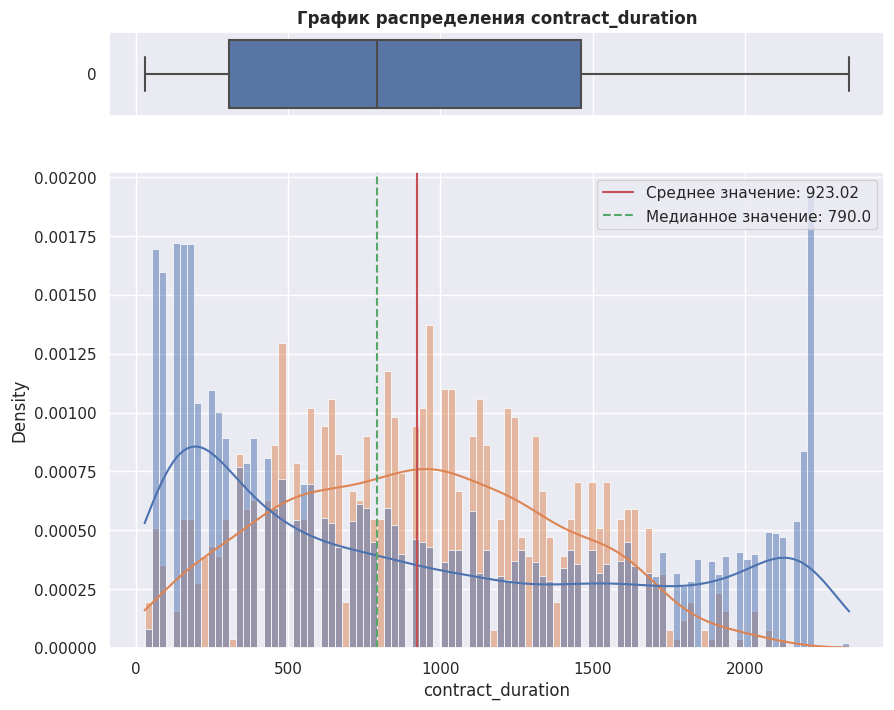

In [41]:
numeric_analysis(сontract_df, 'contract_duration', 'contract_duration')

Контракты у абонентов в среднем длятся 900 дней.

In [42]:
pd.pivot_table(сontract_df, index='target', values='contract_duration', 
                                        aggfunc=['mean', 'median'])

,mean,median
,contract_duration,contract_duration
target,,
0,922.681084,731.0
1,924.863760,915.0


Длительность контракта у ушедших в среднем выше.

count    7043.000000
mean       64.761692
std        30.090047
min        18.250000
25%        35.500000
50%        70.350000
75%        89.850000
max       118.750000
Name: MonthlyCharges, dtype: float64

Верхний ус: 171.38 
Нижний ус: -46.02     
Медианное значение: 70.35


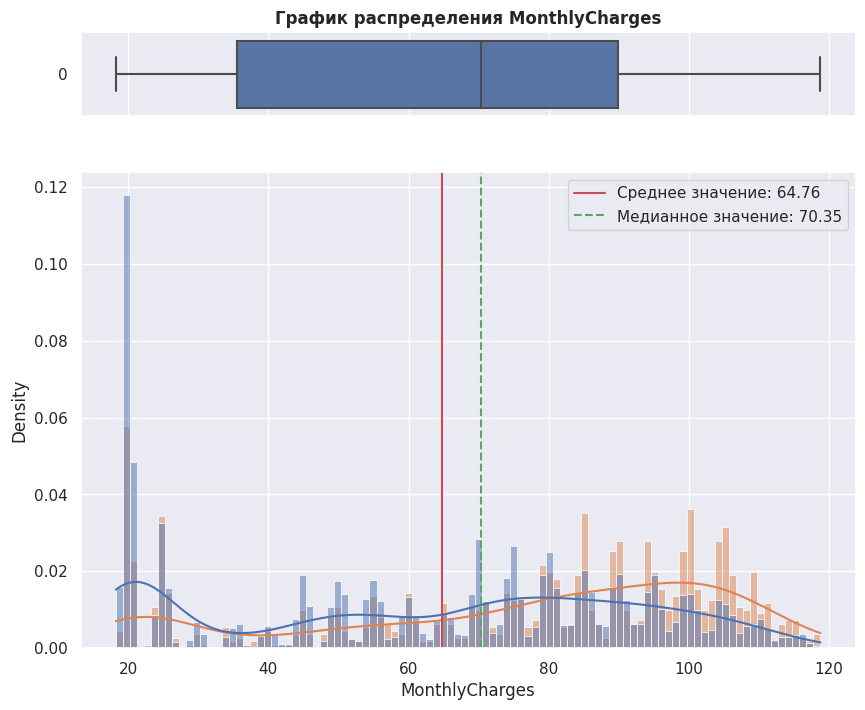

In [43]:
numeric_analysis(сontract_df, 'MonthlyCharges', 'MonthlyCharges')

Высокое кол-во пользователей платит 20 у.е. в месяц. Скорее всего базовый тариф.

Начиная с 80 у.е. в месяц отток абонентов усиливается.

Посмотрим какое средние и медианное значение у ушедших и оставшихся пользователей.

In [44]:
target_monthly_charges = pd.pivot_table(сontract_df, index='target', values='MonthlyCharges', 
                                        aggfunc=['mean', 'median'])
target_monthly_charges.columns = ['mean', 'median']
target_monthly_charges.head()

,mean,median
target,,
0,62.763455,69.2
1,75.546004,84.2


Ушедшие в среднем тратили больше ежемесячно.

count    7043.000000
mean     2115.377573
std      2112.678861
min        19.050000
25%       436.750000
50%      1343.350000
75%      3236.690000
max      9221.380000
Name: TotalCharges, dtype: float64

Верхний ус: 7436.6 
Нижний ус: -3763.16     
Медианное значение: 1343.35


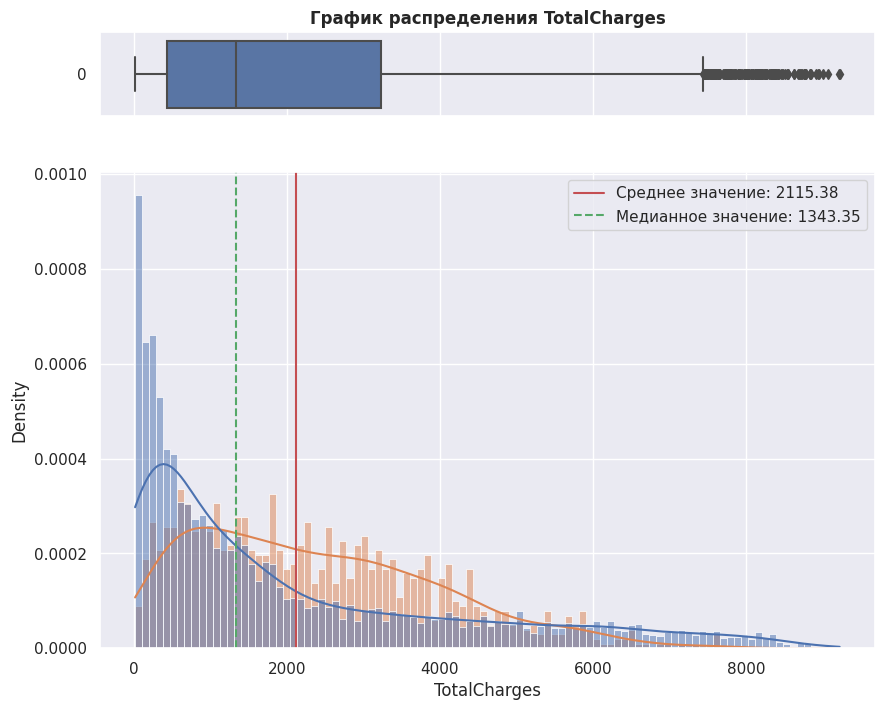

In [45]:
numeric_analysis(сontract_df, 'TotalCharges', 'TotalCharges')

In [46]:
target_total_charges = pd.pivot_table(сontract_df, index='target', values='TotalCharges', 
                                        aggfunc=['mean', 'median', 'sum'])
target_total_charges.columns = ['mean', 'median', 'sum']
target_total_charges.head()

,mean,median,sum
target,,,
0,2067.943095,1192.80,12287717.87
1,2371.377275,2139.03,2610886.38


Если смотреть на траты в целом, то ушедшие тратили больше существующих клиентов.
Анализ признаков в модели покажет какие факторы сильнее всего влияли на решение уйти.

In [47]:
сontract_df['log_total_charges'] = np.log1p(сontract_df['TotalCharges'])

In [48]:
сontract_df['sqrt_total_charges'] = np.sqrt(сontract_df['TotalCharges'])

In [49]:
сontract_df['charge_per_day'] = сontract_df['TotalCharges'] / сontract_df['contract_duration']

count    7043.000000
mean        6.975792
std         1.379870
min         2.998229
25%         6.081647
50%         7.203666
75%         8.082615
max         9.129388
Name: log_total_charges, dtype: float64

Верхний ус: 11.08 
Нижний ус: 3.08     
Медианное значение: 7.203665903847227


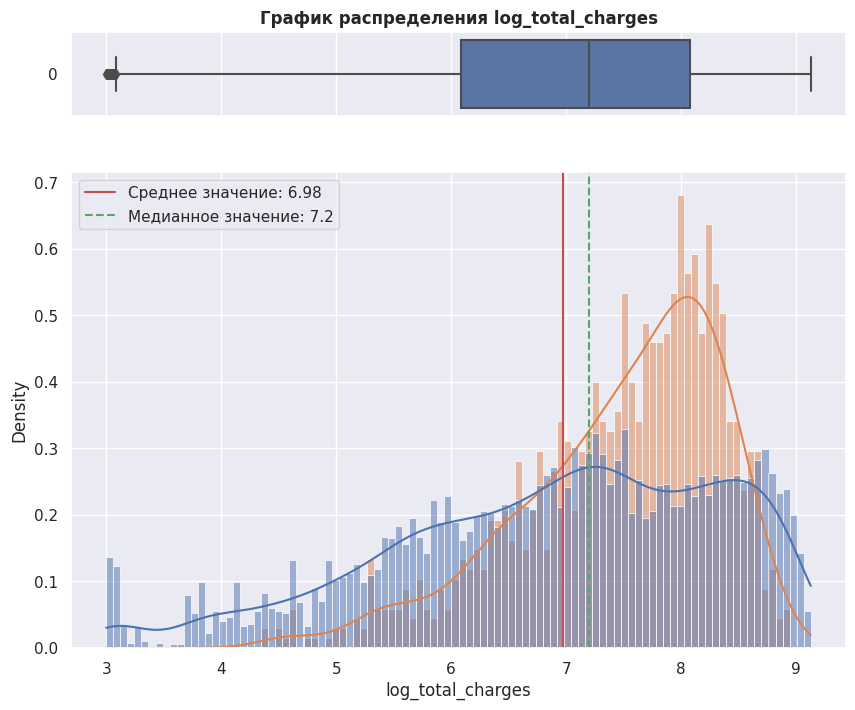

In [50]:
numeric_analysis(сontract_df, 'log_total_charges', 'log_total_charges')

count    7043.000000
mean       39.979959
std        22.738818
min         4.364631
25%        20.898562
50%        36.651739
75%        56.891915
max        96.028017
Name: sqrt_total_charges, dtype: float64

Верхний ус: 110.88 
Нижний ус: -33.09     
Медианное значение: 36.65173938573721


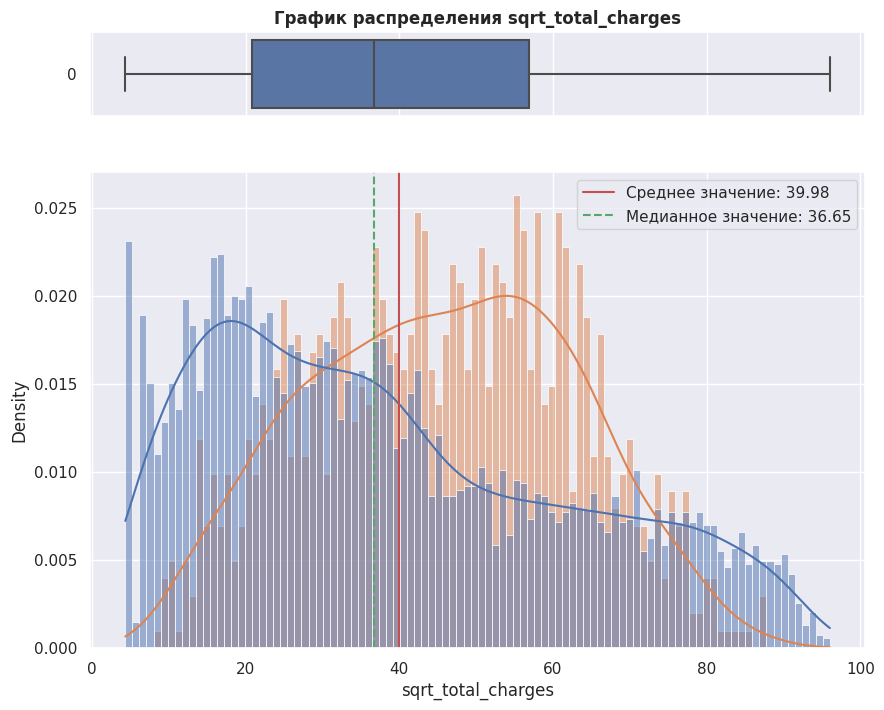

In [51]:
numeric_analysis(сontract_df, 'sqrt_total_charges', 'sqrt_total_charges')

count    7043.000000
mean        2.046466
std         1.023925
min         0.317500
25%         0.977678
50%         2.144209
75%         2.897938
max         4.154471
Name: charge_per_day, dtype: float64

Верхний ус: 5.78 
Нижний ус: -1.9     
Медианное значение: 2.1442089552238803


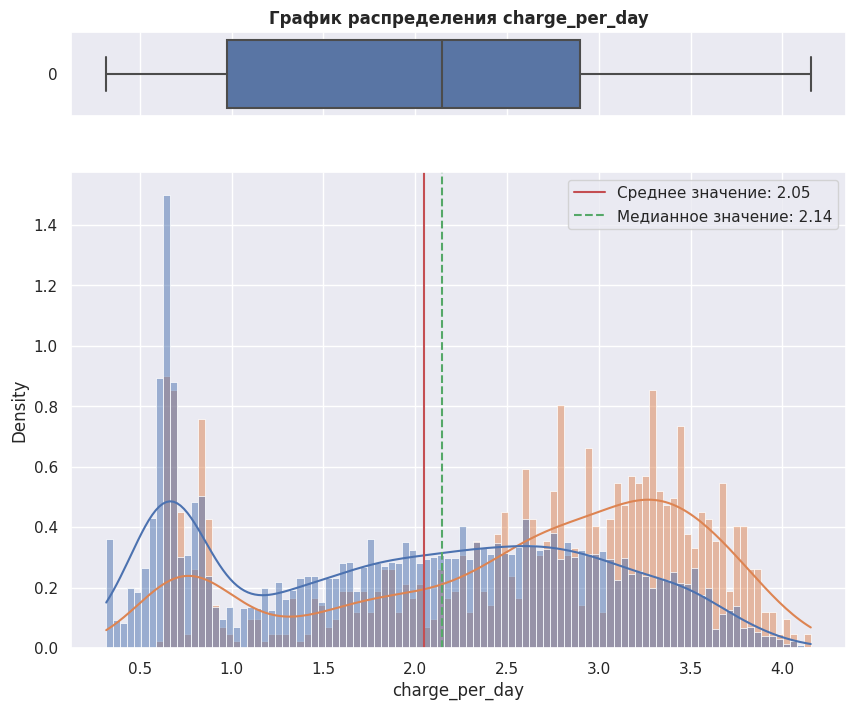

In [52]:
numeric_analysis(сontract_df, 'charge_per_day', 'charge_per_day')

In [53]:
pd.pivot_table(сontract_df, index='target', values='charge_per_day', 
                                        aggfunc=['mean', 'median'])

,mean,median
,charge_per_day,charge_per_day
target,,
0,1.952873,2.013859
1,2.551579,2.794408


### Персональные данные клиентов

In [54]:
personal_df = pd.read_sql_query(personal_q, con = engine)

`personal` — персональные данные клиентов;
* customerID — ID пользователя;
* gender — пол;
* SeniorCitizen — является ли абонент пенсионером;
* Partner — есть ли у абонента супруг или супруга;
* Dependents — есть ли у абонента дети.

In [55]:
personal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   object
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: object(5)
memory usage: 275.2+ KB


In [56]:
personal_df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [57]:
merged_df = pd.merge(сontract_df, personal_df, on='customerID', how='left')

In [58]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   customerID          7043 non-null   object        
 1   BeginDate           7043 non-null   datetime64[ns]
 2   EndDate             7043 non-null   object        
 3   Type                7043 non-null   object        
 4   PaperlessBilling    7043 non-null   object        
 5   PaymentMethod       7043 non-null   object        
 6   MonthlyCharges      7043 non-null   float64       
 7   TotalCharges        7043 non-null   float64       
 8   target              7043 non-null   int64         
 9   contract_end_date   7043 non-null   datetime64[ns]
 10  contract_duration   7043 non-null   int64         
 11  begin_year          7043 non-null   int32         
 12  begin_month         7043 non-null   int32         
 13  begin_day           7043 non-null   int32       

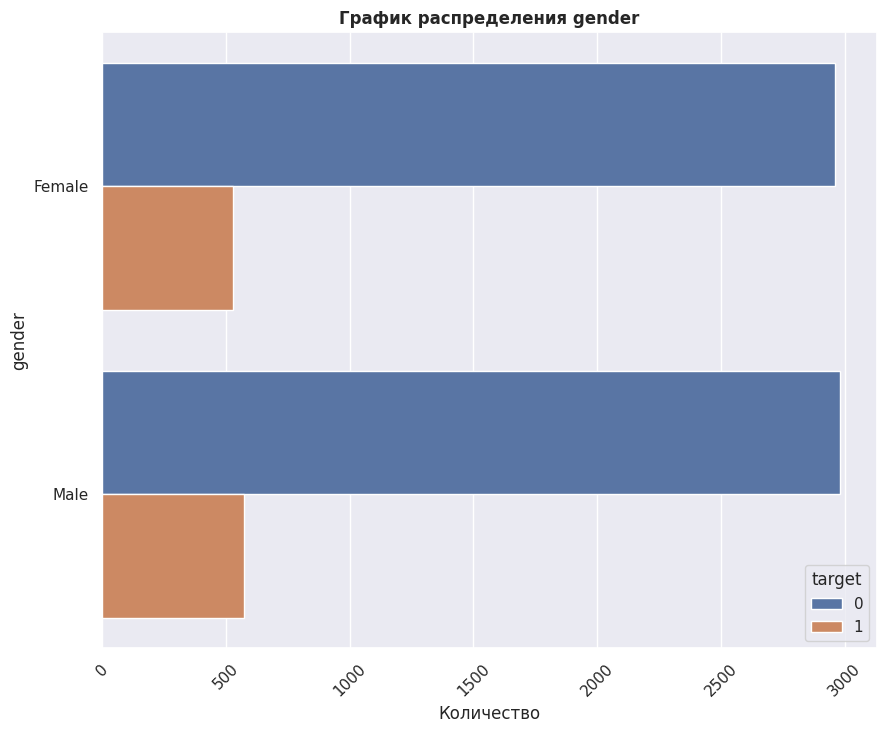

gender
Male      3555
Female    3488
Name: count, dtype: int64

In [59]:
cat_vis(merged_df, 'gender', 'target')

* Количество пользователей по половому признаку распределено практически равномерно.
* Доли ушедших пользователей также практически равны.

In [60]:
fin_analysis(merged_df, 'gender', 'TotalCharges')

target,0,1
gender,,
Female,2091.635902,2396.037064
Male,2044.425084,2348.654119


Женщины и мужчины в целом тратят одинаково.

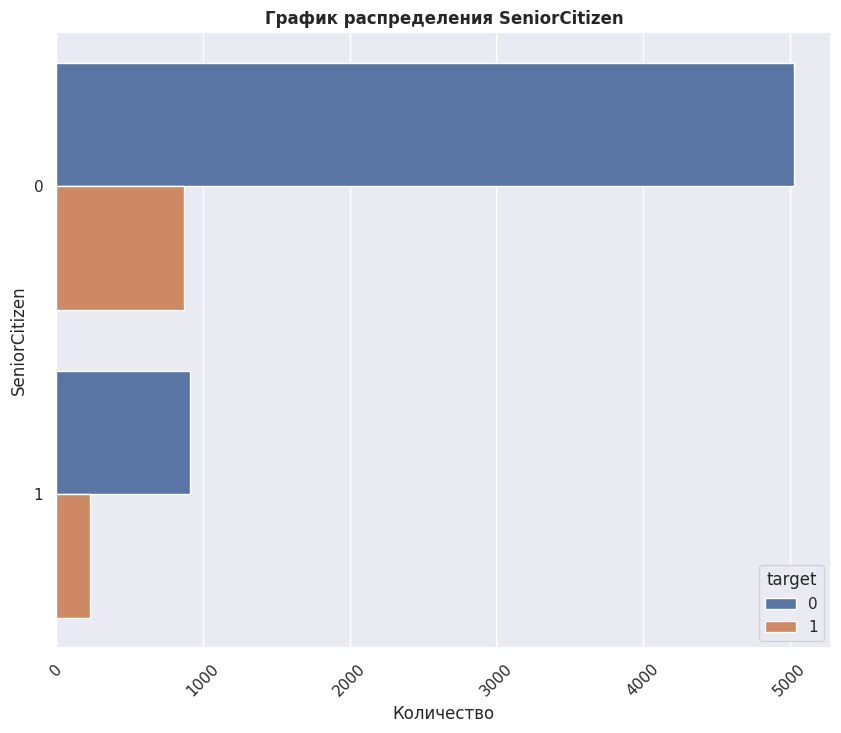

SeniorCitizen
0    5901
1    1142
Name: count, dtype: int64

In [61]:
cat_vis(merged_df, 'SeniorCitizen', 'target')

In [62]:
fin_analysis(merged_df, 'SeniorCitizen', 'TotalCharges')

target,0,1
SeniorCitizen,,
0,1980.717413,2302.089816
1,2550.272363,2630.906595


Пенсионеры тратят больше.

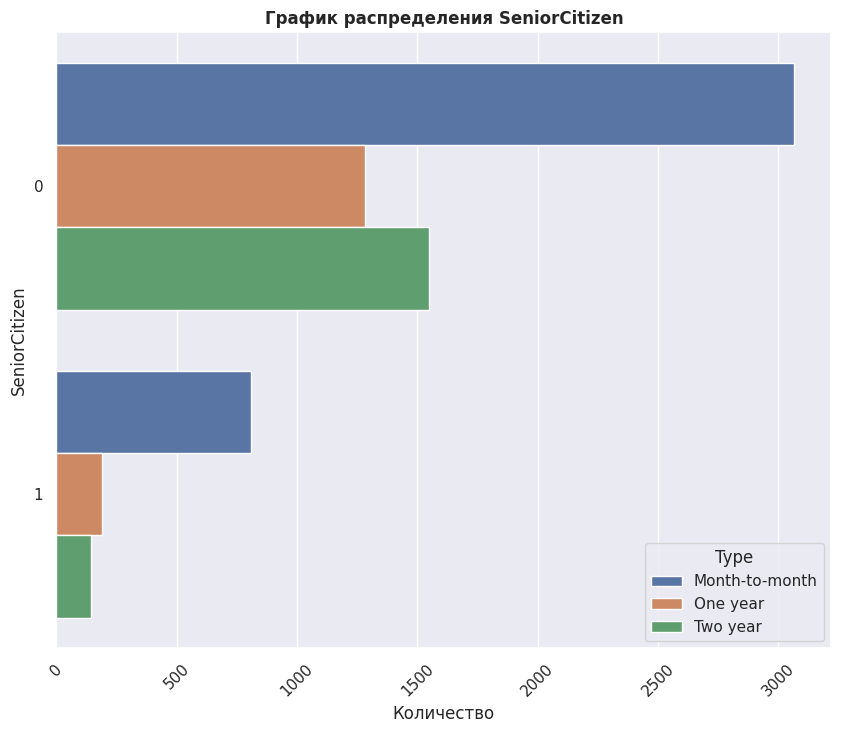

SeniorCitizen
0    5901
1    1142
Name: count, dtype: int64

In [63]:
cat_vis(merged_df, 'SeniorCitizen', 'Type')

Высокие траты связаны с тем, что пенсионеры больше предпочитают ежемесячную оплату.

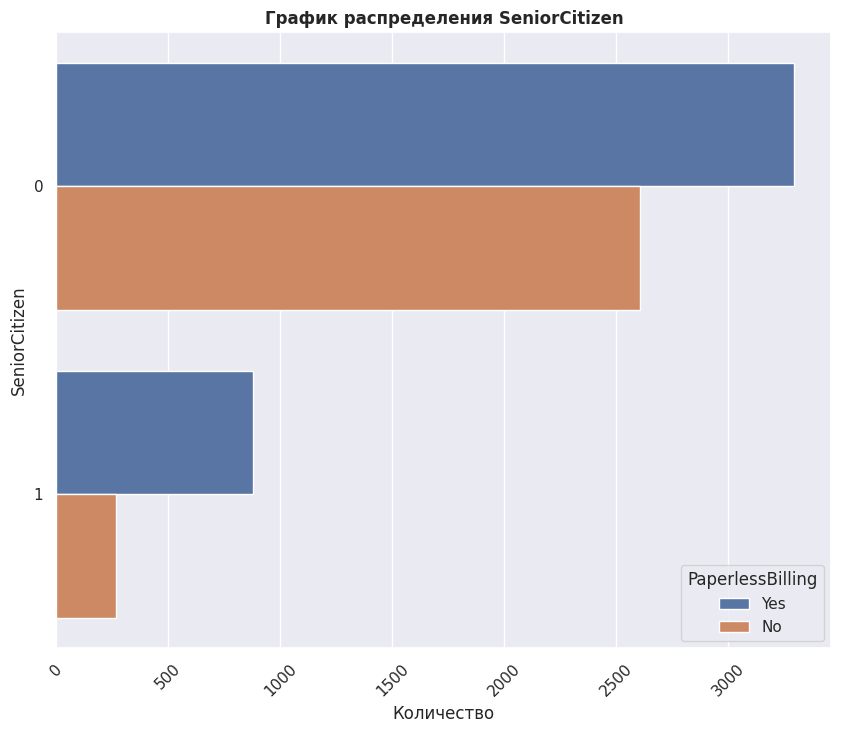

SeniorCitizen
0    5901
1    1142
Name: count, dtype: int64

In [64]:
cat_vis(merged_df, 'SeniorCitizen', 'PaperlessBilling')

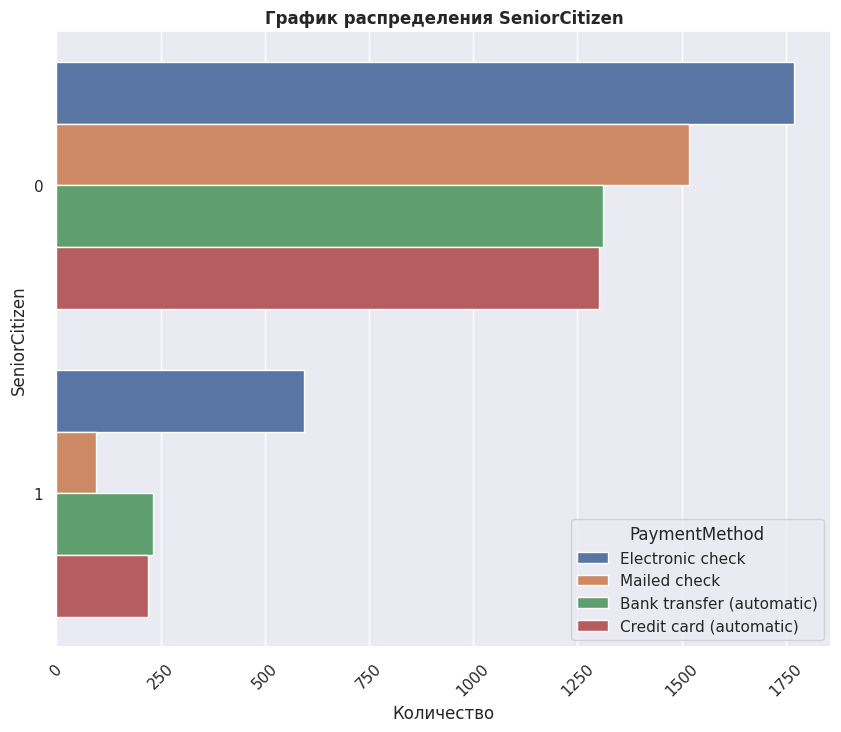

SeniorCitizen
0    5901
1    1142
Name: count, dtype: int64

In [65]:
cat_vis(merged_df, 'SeniorCitizen', 'PaymentMethod')

Пенсионеры меньше пользуются отправкой чеков по почте.

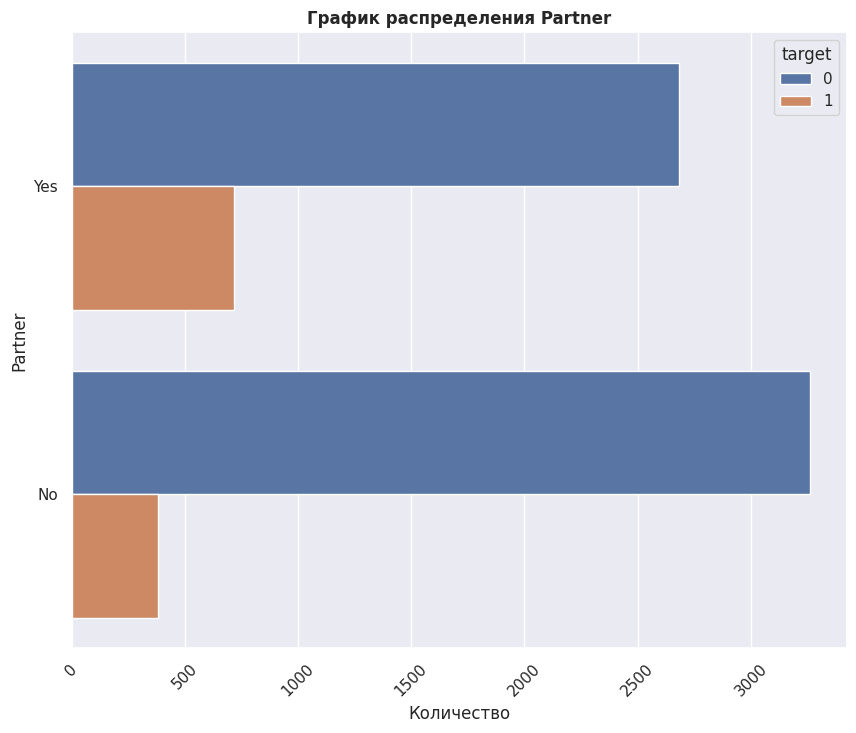

Partner
No     3641
Yes    3402
Name: count, dtype: int64

In [66]:
cat_vis(merged_df, 'Partner', 'target')

* Одиникоких абонентов больше.
* Абонентов с супргом/супргой ушло больше, что логично, так как если один член семьи меняет оператора, то переводит к нему всю семью.

In [67]:
fin_analysis(merged_df, 'Partner', 'TotalCharges')

target,0,1
Partner,,
No,1444.836330,2215.365550
Yes,2824.821569,2454.265285


* Действующие абоненты с супргом/супругой тратят больше.
* При этом кто ушел тратили примерно одинаково.

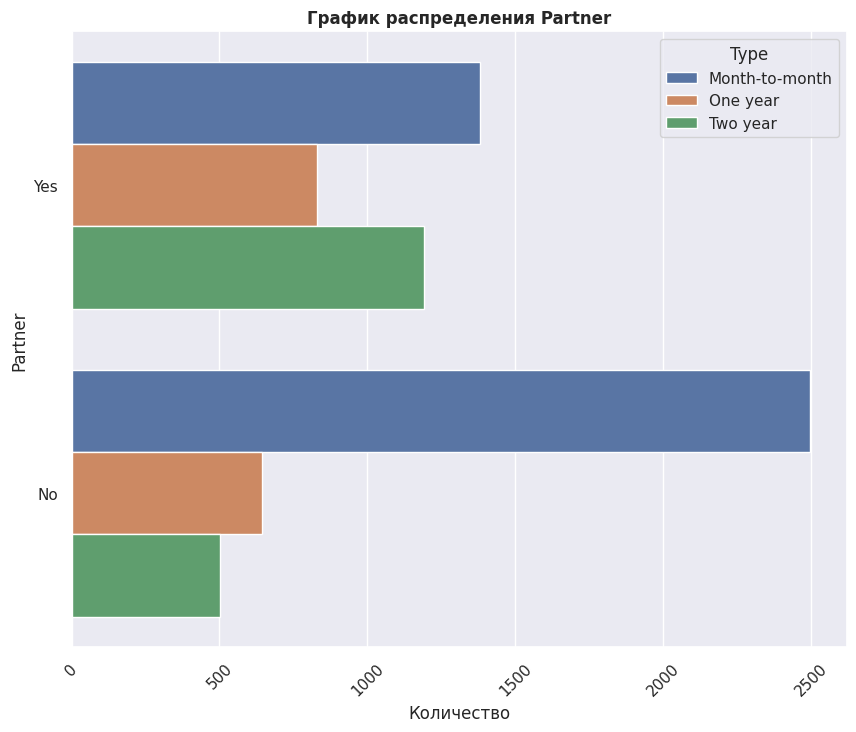

Partner
No     3641
Yes    3402
Name: count, dtype: int64

In [68]:
cat_vis(merged_df, 'Partner', 'Type')

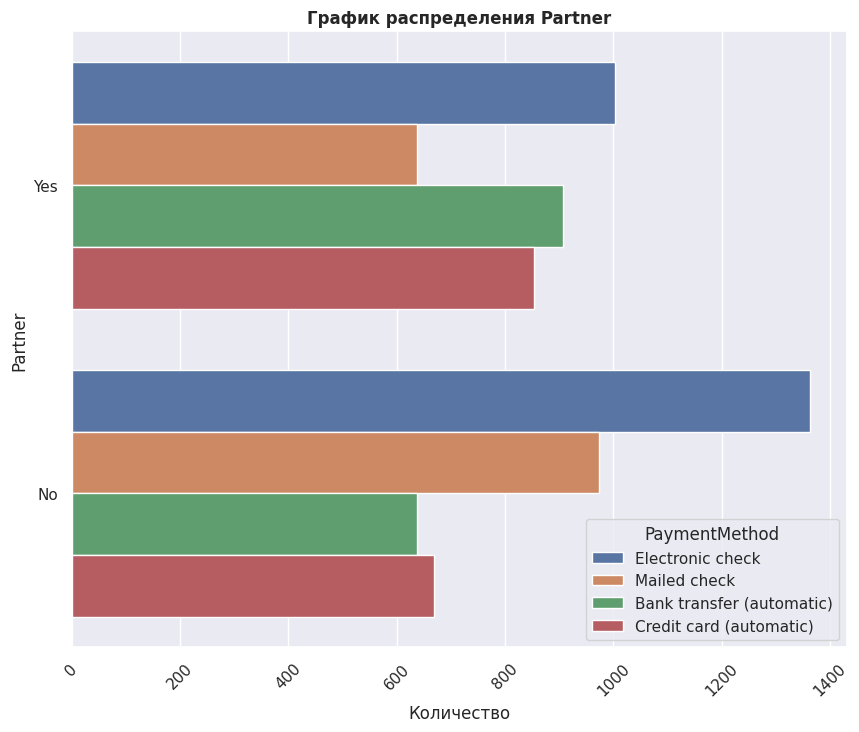

Partner
No     3641
Yes    3402
Name: count, dtype: int64

In [69]:
cat_vis(merged_df, 'Partner', 'PaymentMethod')

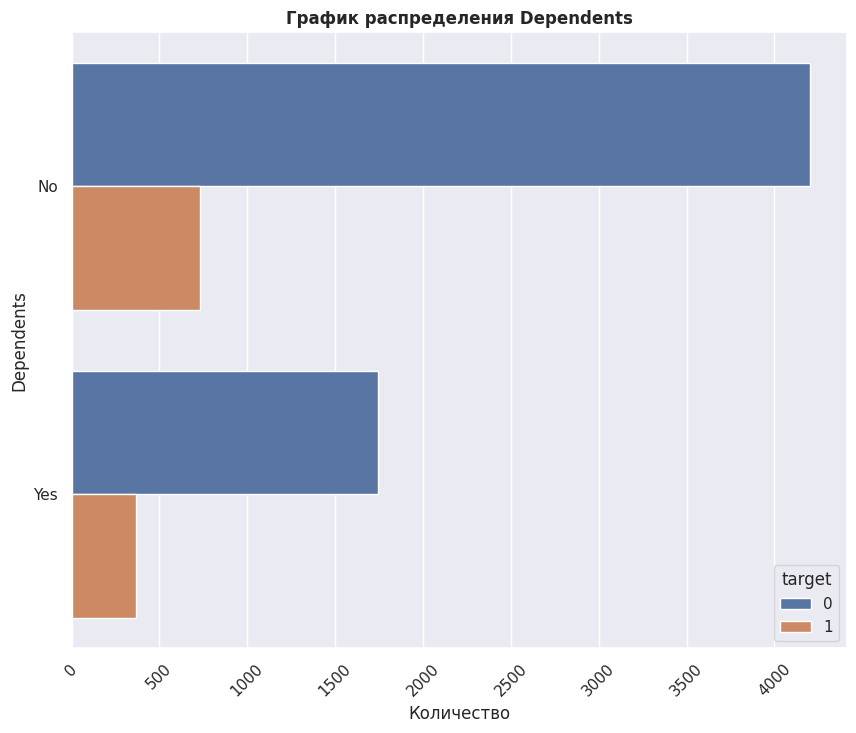

Dependents
No     4933
Yes    2110
Name: count, dtype: int64

In [70]:
cat_vis(merged_df, 'Dependents', 'target')

Среди абонентов преобладают бездетные.

In [71]:
fin_analysis(merged_df, 'Dependents', 'TotalCharges')

target,0,1
Dependents,,
No,1968.755376,2455.235157
Yes,2307.086848,2204.345136


* Бездетные бывшие абоненты тратили в среднем больше, чем текущие абоненты с детьми.

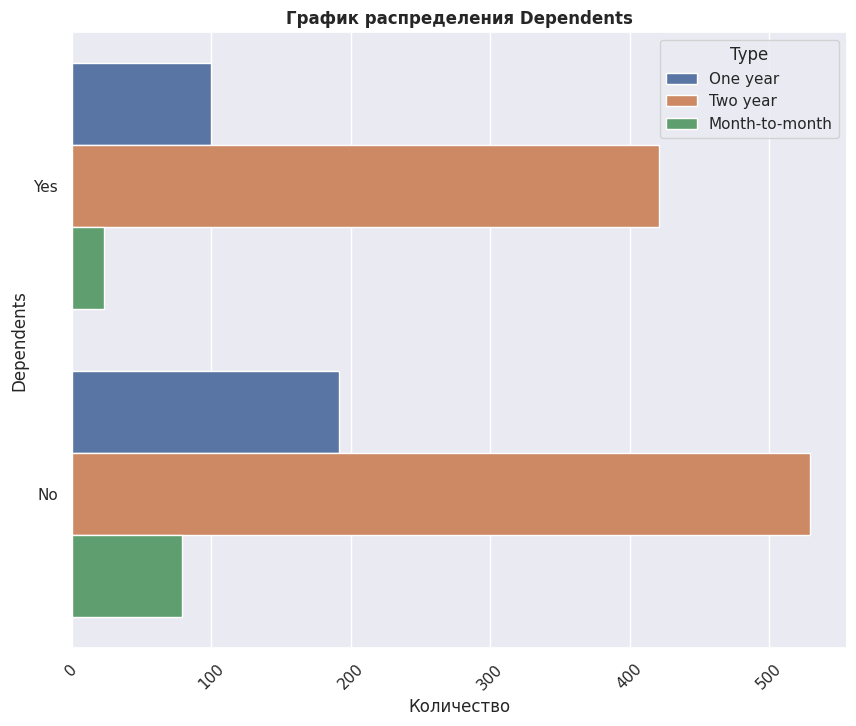

Dependents
No     800
Yes    544
Name: count, dtype: int64

In [72]:
cat_vis(merged_df[merged_df['begin_year'] == 2014], 'Dependents', 'Type')

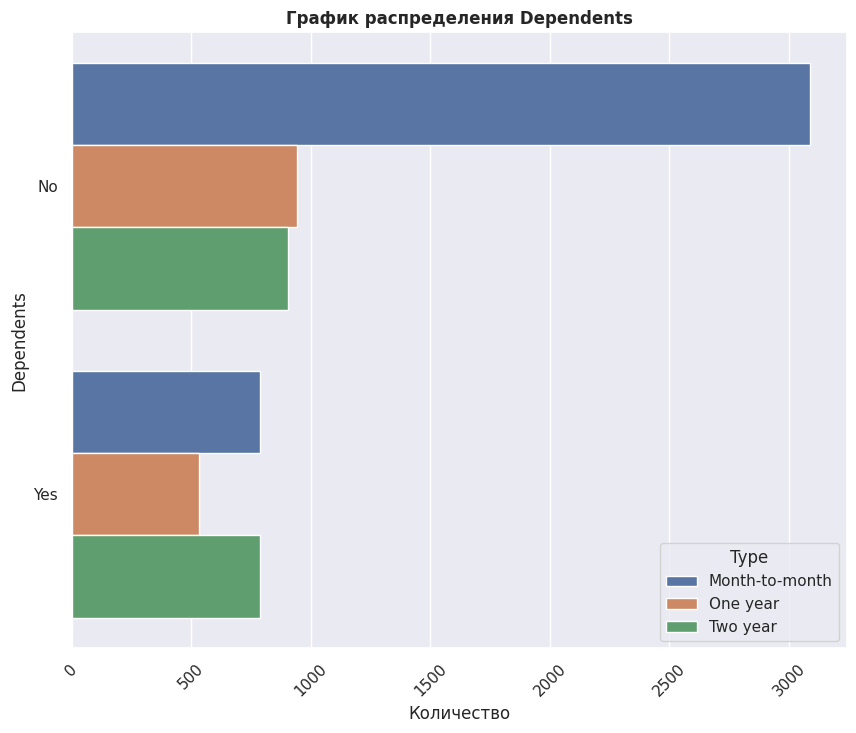

Dependents
No     4933
Yes    2110
Name: count, dtype: int64

In [73]:
cat_vis(merged_df, 'Dependents', 'Type')

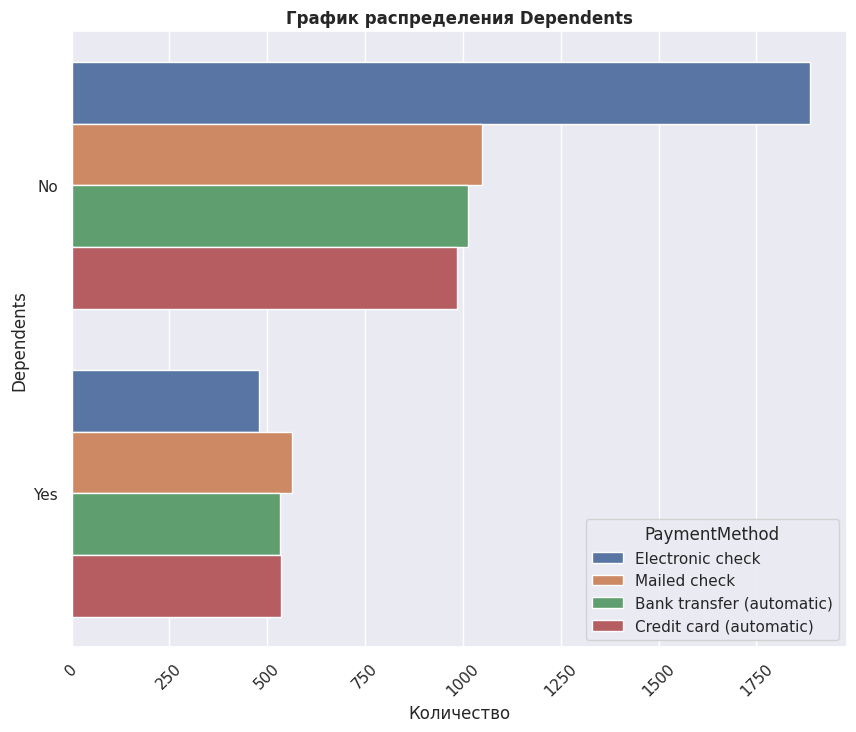

Dependents
No     4933
Yes    2110
Name: count, dtype: int64

In [74]:
cat_vis(merged_df, 'Dependents', 'PaymentMethod')

### Интернет-услуги

In [75]:
internet_df = pd.read_sql_query(internet_q, con = engine)

`internet` — информация об интернет-услугах;
* customerID — ID пользователя;
* InternetService — тип подключения;
* OnlineSecurity — блокировка опасных сайтов;
* OnlineBackup — облачное хранилище файлов для резервного копирования данных;
* DeviceProtection — антивирус;
* TechSupport — выделенная линия технической поддержки;
* StreamingTV — стриминговое телевидение;
* StreamingMovies — каталог фильмов.

In [76]:
internet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [77]:
internet_df.head()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [78]:
merged_df = pd.merge(merged_df, internet_df, on='customerID', how='left')

Заполним пропуски в категориальных признаках заглушкой `unknown`.

In [79]:
for col in merged_df.columns:
    if merged_df[col].dtype == 'object' and merged_df[col].isna().any():
        merged_df[col].fillna('unknown', inplace=True)

In [80]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   customerID          7043 non-null   object        
 1   BeginDate           7043 non-null   datetime64[ns]
 2   EndDate             7043 non-null   object        
 3   Type                7043 non-null   object        
 4   PaperlessBilling    7043 non-null   object        
 5   PaymentMethod       7043 non-null   object        
 6   MonthlyCharges      7043 non-null   float64       
 7   TotalCharges        7043 non-null   float64       
 8   target              7043 non-null   int64         
 9   contract_end_date   7043 non-null   datetime64[ns]
 10  contract_duration   7043 non-null   int64         
 11  begin_year          7043 non-null   int32         
 12  begin_month         7043 non-null   int32         
 13  begin_day           7043 non-null   int32       

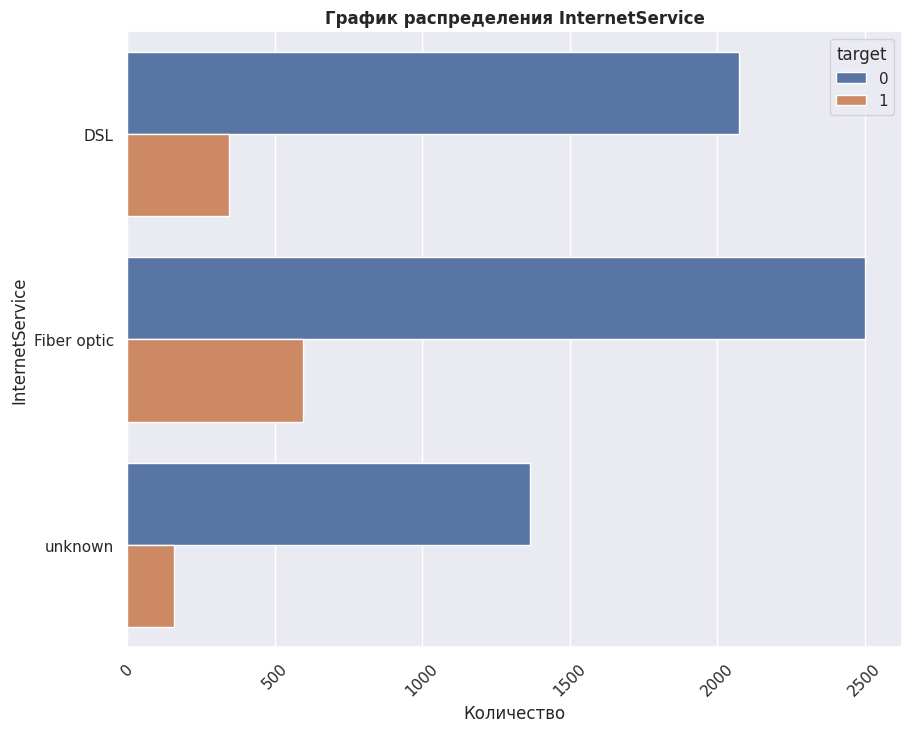

InternetService
Fiber optic    3096
DSL            2421
unknown        1526
Name: count, dtype: int64

In [81]:
cat_vis(merged_df, 'InternetService', 'target')

In [82]:
fin_analysis(merged_df, 'InternetService', 'TotalCharges')

target,0,1
InternetService,,
DSL,1950.705152,2104.454480
Fiber optic,2958.023295,2971.146034
unknown,616.389766,718.207750


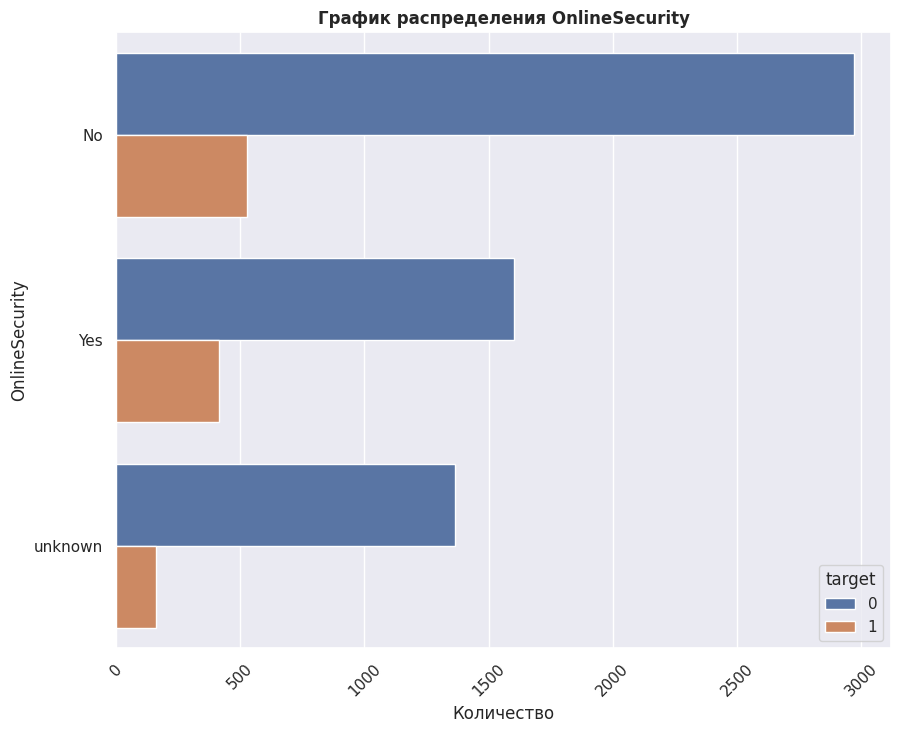

OnlineSecurity
No         3498
Yes        2019
unknown    1526
Name: count, dtype: int64

In [83]:
cat_vis(merged_df, 'OnlineSecurity', 'target')

In [84]:
fin_analysis(merged_df, 'OnlineSecurity', 'TotalCharges')

target,0,1
OnlineSecurity,,
No,1920.582638,2509.161939
Yes,3577.155767,2834.105928
unknown,616.389766,718.207750


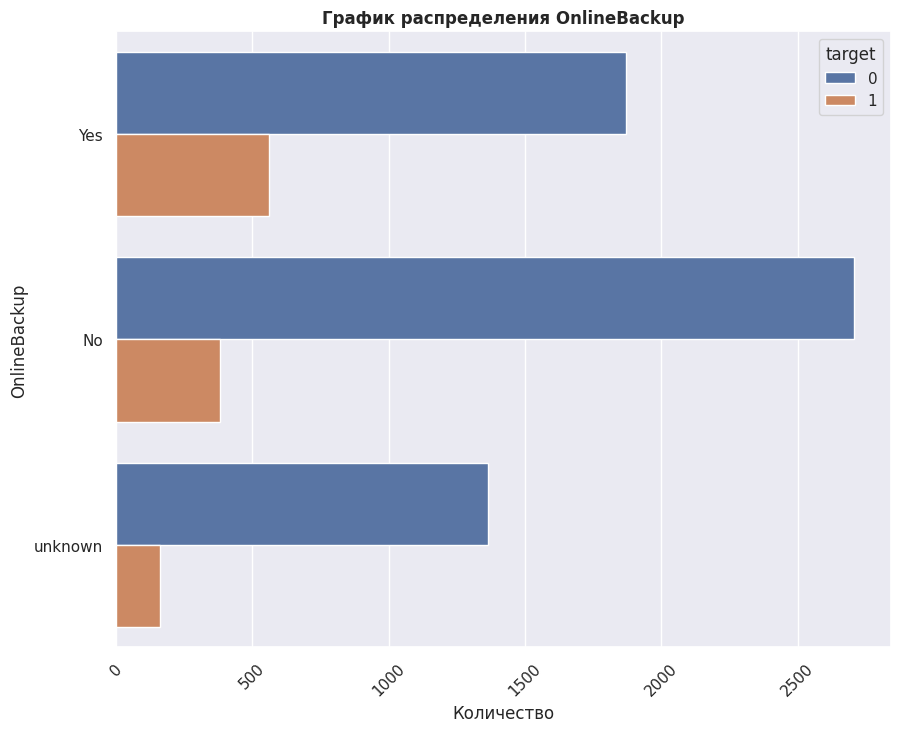

OnlineBackup
No         3088
Yes        2429
unknown    1526
Name: count, dtype: int64

In [85]:
cat_vis(merged_df, 'OnlineBackup', 'target')

In [86]:
fin_analysis(merged_df, 'OnlineBackup', 'TotalCharges')

target,0,1
OnlineBackup,,
No,1690.477525,2209.223176
Yes,3675.552055,2954.034125
unknown,616.389766,718.207750


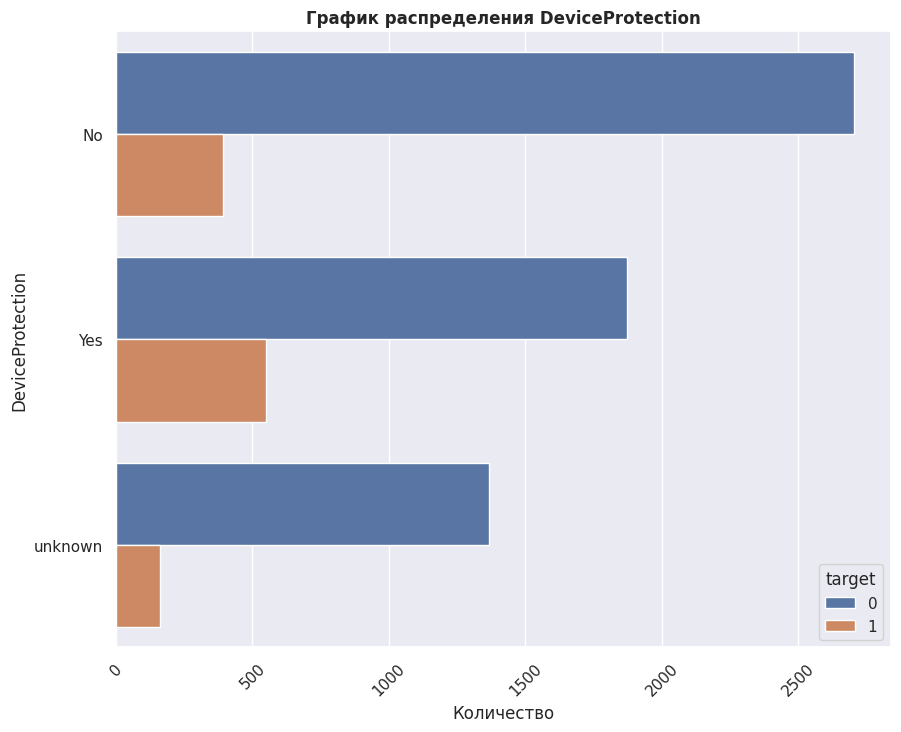

DeviceProtection
No         3095
Yes        2422
unknown    1526
Name: count, dtype: int64

In [87]:
cat_vis(merged_df, 'DeviceProtection', 'target')

In [88]:
fin_analysis(merged_df, 'DeviceProtection', 'TotalCharges')

target,0,1
DeviceProtection,,
No,1633.026845,2312.432813
Yes,3755.355160,2894.203473
unknown,616.389766,718.207750


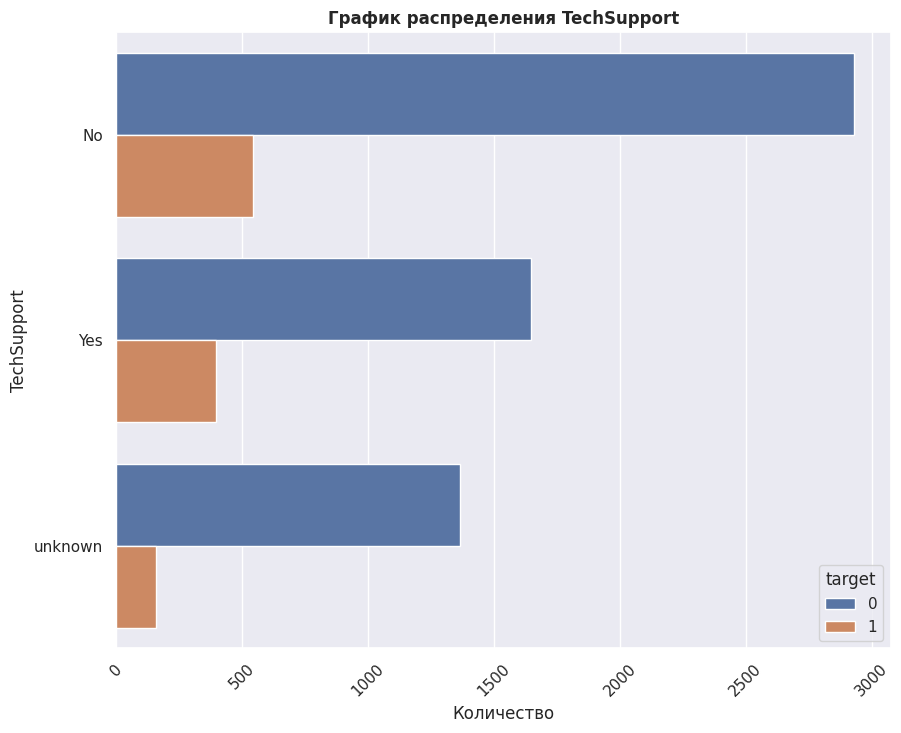

TechSupport
No         3473
Yes        2044
unknown    1526
Name: count, dtype: int64

In [89]:
cat_vis(merged_df, 'TechSupport', 'target')

In [90]:
fin_analysis(merged_df, 'TechSupport', 'TotalCharges')

target,0,1
TechSupport,,
No,1856.726031,2467.524622
Yes,3648.555395,2904.792136
unknown,616.389766,718.207750


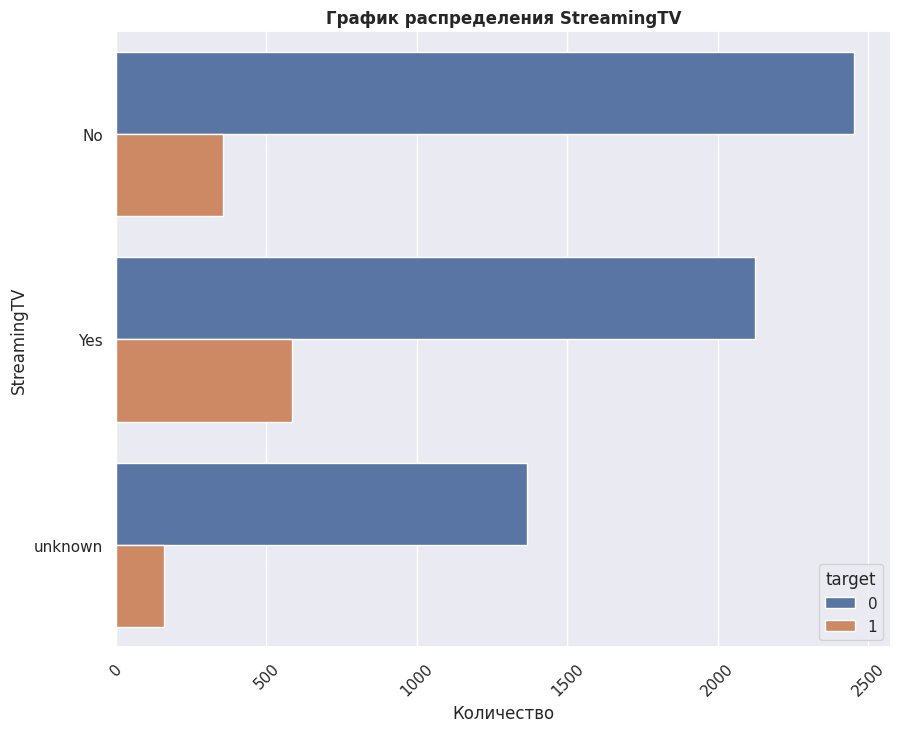

StreamingTV
No         2810
Yes        2707
unknown    1526
Name: count, dtype: int64

In [91]:
cat_vis(merged_df, 'StreamingTV', 'target')

In [92]:
fin_analysis(merged_df, 'StreamingTV', 'TotalCharges')

target,0,1
StreamingTV,,
No,1574.012413,2106.813669
Yes,3572.622233,2986.028527
unknown,616.389766,718.207750


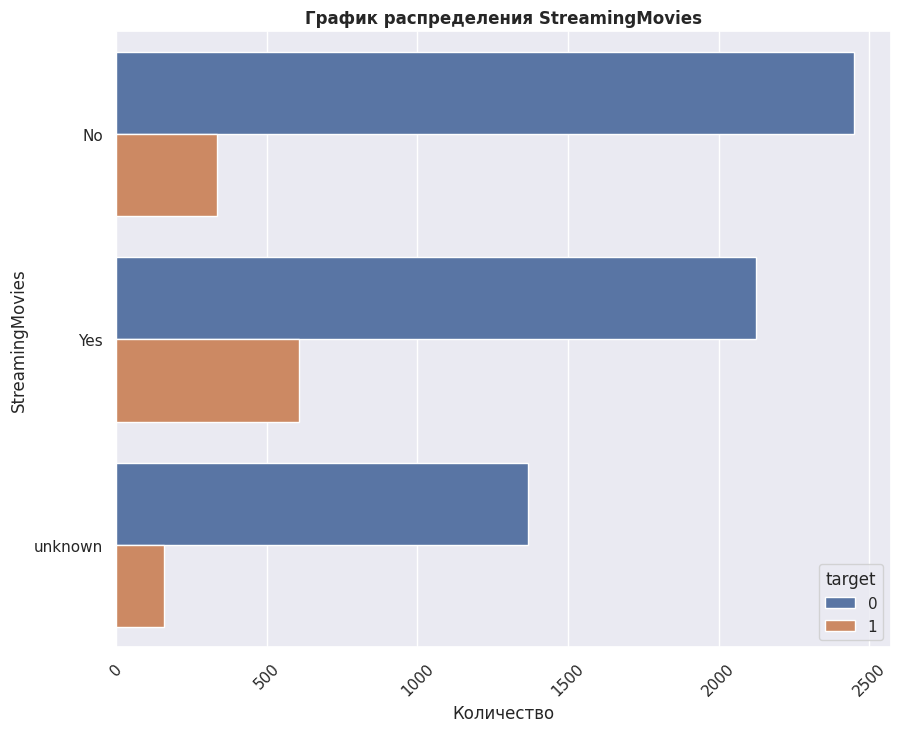

StreamingMovies
No         2785
Yes        2732
unknown    1526
Name: count, dtype: int64

In [93]:
cat_vis(merged_df, 'StreamingMovies', 'target')

In [94]:
fin_analysis(merged_df, 'StreamingMovies', 'TotalCharges')

target,0,1
StreamingMovies,,
No,1576.026767,2131.026776
Yes,3567.480654,2940.724703
unknown,616.389766,718.207750


In [95]:
merged_df['service_count'] = (merged_df == 'Yes').sum(axis=1)

In [96]:
merged_df['total_charge_per_service'] = np.where(
    merged_df['service_count'] == 0,
    0,
    merged_df['TotalCharges'] / merged_df['service_count']
)

In [97]:
merged_df['monthly_charge_per_service'] = np.where(
    merged_df['service_count'] == 0,
    0,
    merged_df['MonthlyCharges'] / merged_df['service_count']
)

In [98]:
merged_df.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,target,contract_end_date,contract_duration,begin_year,begin_month,begin_day,begin_weekday,begin_dayofyear,log_total_charges,sqrt_total_charges,charge_per_day,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,service_count,total_charge_per_service,monthly_charge_per_service
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04,0,2020-03-01,60,2020,1,1,2,1,3.466985,5.571355,0.517333,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,3,10.346667,9.950
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84,0,2020-03-01,1065,2017,4,1,5,91,7.636675,45.517469,1.945390,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,2,1035.920000,28.475
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17,0,2020-03-01,152,2019,10,1,1,274,5.425699,15.038949,1.487961,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,3,75.390000,17.950
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.60,0,2020-03-01,1400,2016,5,1,6,122,7.581516,44.278663,1.400429,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,3,653.533333,14.100
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.50,0,2020-03-01,182,2019,9,1,6,244,5.870708,18.801596,1.942308,Female,0,No,No,Fiber optic,No,No,No,No,No,No,1,353.500000,70.700


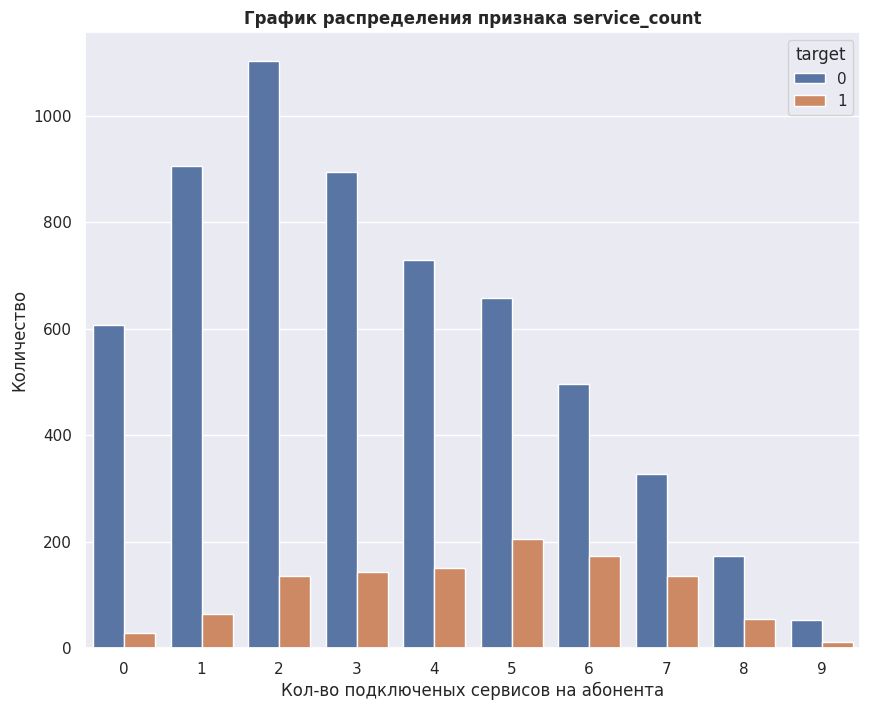

In [99]:
sns.countplot(x ='service_count', data = merged_df, hue='target')
plt.title('График распределения признака service_count', weight='bold')
plt.xlabel('Кол-во подключеных сервисов на абонента')
plt.ylabel('Количество')
plt.show()

In [100]:
merged_df['service_count'].value_counts()

service_count
2    1237
3    1038
1     968
4     879
5     863
6     669
0     635
7     462
8     227
9      65
Name: count, dtype: int64

In [101]:
pd.pivot_table(merged_df, 
                   index='target',
                   values='service_count',
                   aggfunc='mean')

,service_count
target,
0,3.216930
1,4.469573


В среденем ушедшие абоненты подкючили себе 4-5 сервиса. Что выше чем у оставшихся абонентов.

count    7043.000000
mean      536.123907
std       490.669477
min         0.000000
25%       154.851000
50%       437.730000
75%       801.687500
max      4724.480000
Name: total_charge_per_service, dtype: float64

Верхний ус: 1771.94 
Нижний ус: -815.4     
Медианное значение: 437.73


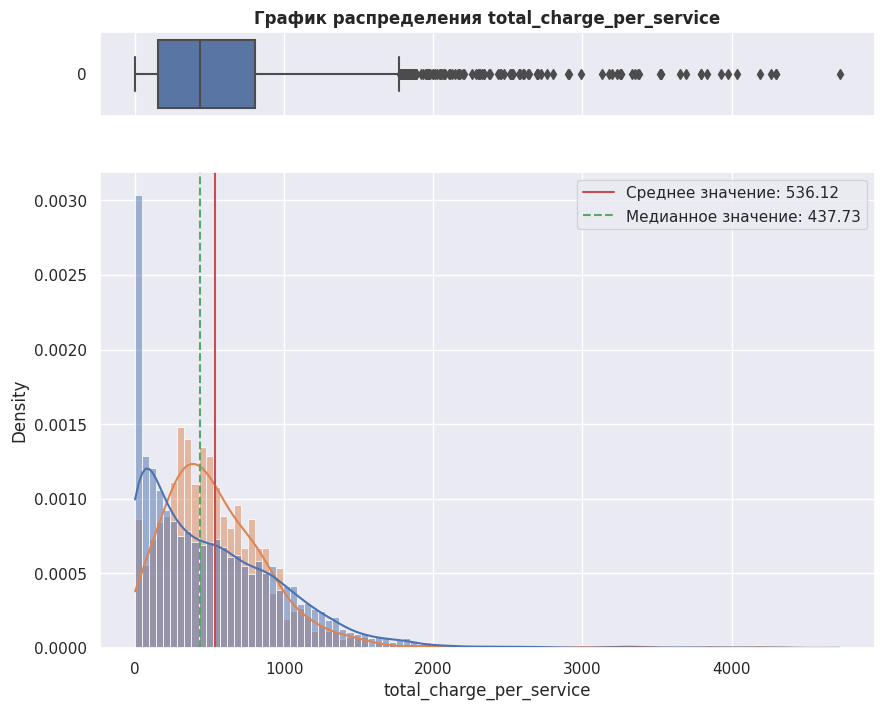

In [102]:
numeric_analysis(merged_df, 'total_charge_per_service', 'total_charge_per_service')

In [103]:
merged_df['sqrt_total_charges_per_srvc'] = np.sqrt(merged_df['total_charge_per_service'])

count    7043.000000
mean       20.282778
std        11.169178
min         0.000000
25%        12.443914
50%        20.921998
75%        28.314087
max        68.734853
Name: sqrt_total_charges_per_srvc, dtype: float64

Верхний ус: 52.12 
Нижний ус: -11.36     
Медианное значение: 20.921997992543638


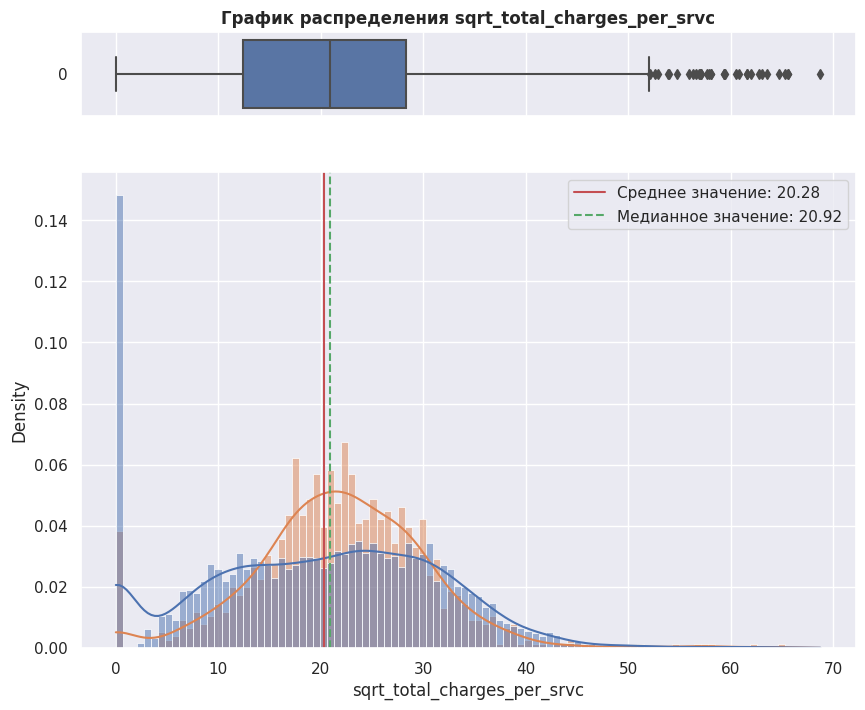

In [104]:
numeric_analysis(merged_df, 'sqrt_total_charges_per_srvc', 'sqrt_total_charges_per_srvc')

count    7043.000000
mean       20.512836
std        15.576922
min         0.000000
25%        11.475000
50%        17.487500
75%        24.950000
max        86.450000
Name: monthly_charge_per_service, dtype: float64

Верхний ус: 45.16 
Нижний ус: -8.74     
Медианное значение: 17.4875


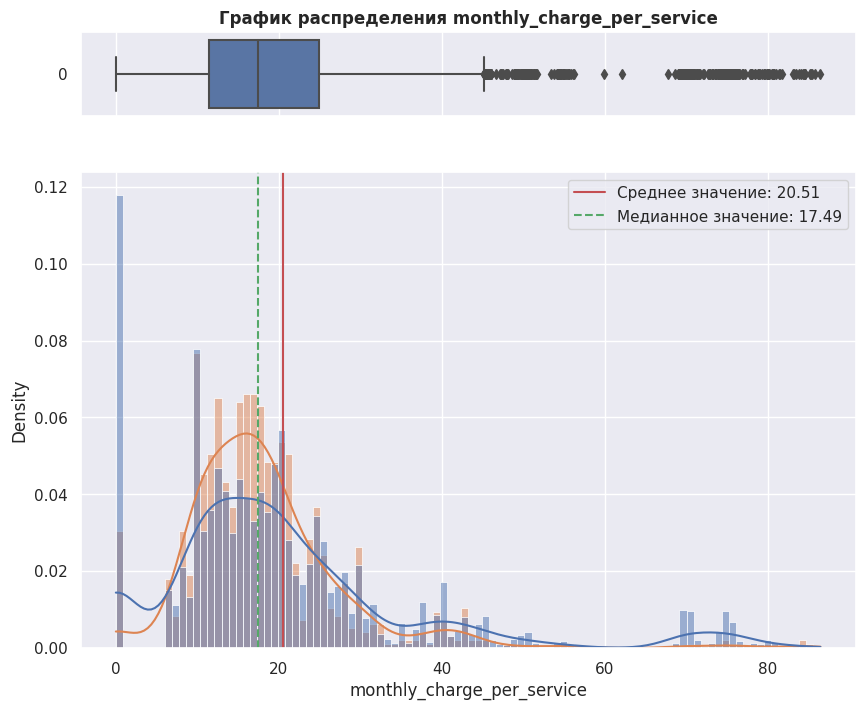

In [105]:
numeric_analysis(merged_df, 'monthly_charge_per_service', 'monthly_charge_per_service')

In [106]:
merged_df['sqrt_monthly_charges_per_srvc'] = np.sqrt(merged_df['monthly_charge_per_service'])

count    7043.000000
mean        4.143830
std         1.828109
min         0.000000
25%         3.387477
50%         4.181806
75%         4.994997
max         9.297849
Name: sqrt_monthly_charges_per_srvc, dtype: float64

Верхний ус: 7.41 
Нижний ус: 0.98     
Медианное значение: 4.181805830021284


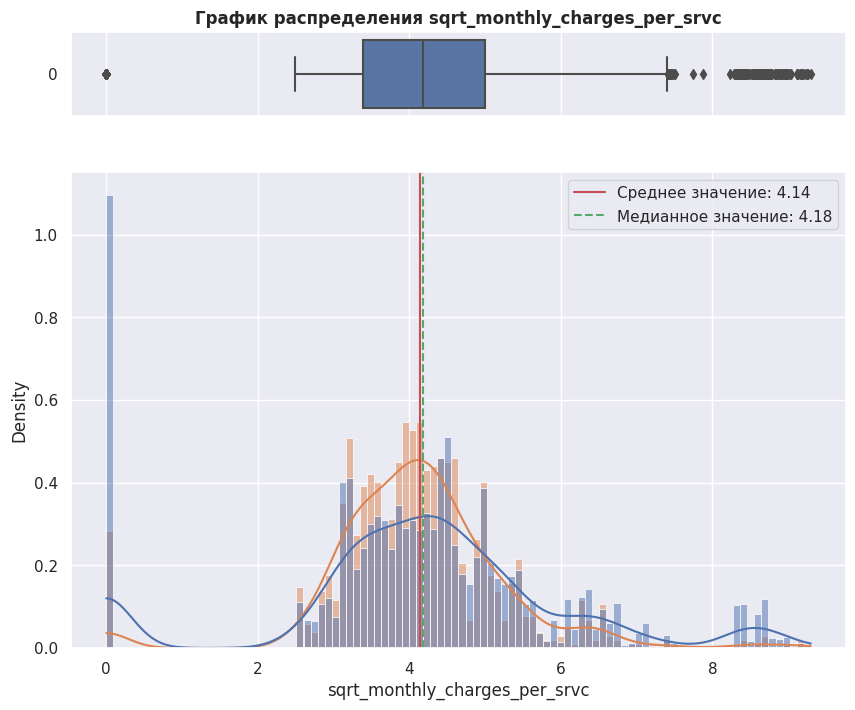

In [107]:
numeric_analysis(merged_df, 'sqrt_monthly_charges_per_srvc', 'sqrt_monthly_charges_per_srvc')

In [108]:
merged_df['contract_dur_per_srvc'] = np.where(
    merged_df['service_count'] == 0,
    0,
    merged_df['contract_duration'] / merged_df['service_count']
)

count    7043.000000
mean      284.282893
std       323.152239
min         0.000000
25%        91.000000
50%       208.714286
75%       345.000000
max      2220.000000
Name: contract_dur_per_srvc, dtype: float64

Верхний ус: 726.0 
Нижний ус: -290.0     
Медианное значение: 208.71428571428572


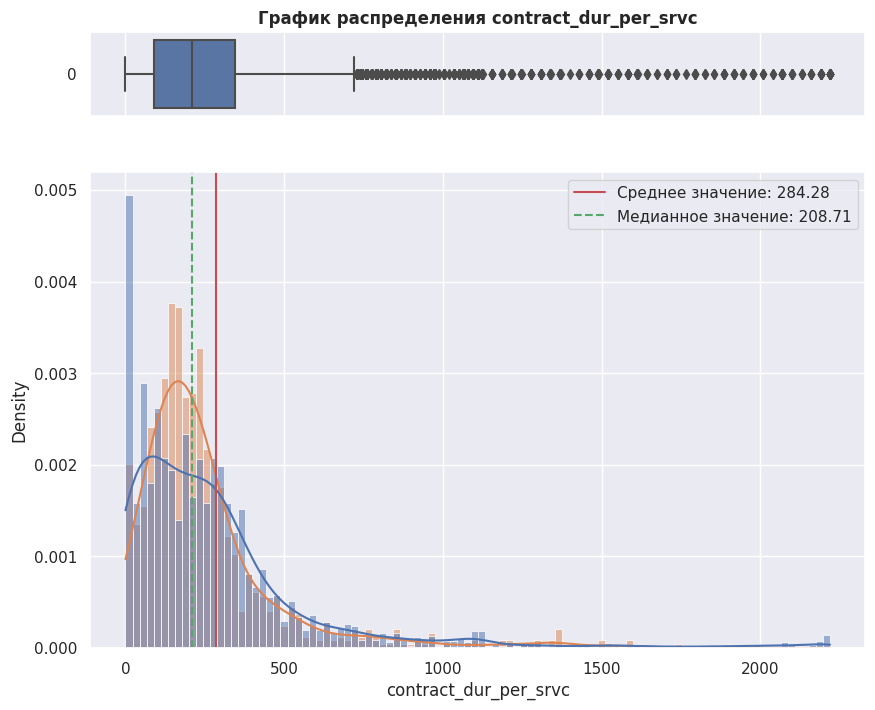

In [109]:
numeric_analysis(merged_df, 'contract_dur_per_srvc', 'contract_dur_per_srvc')

In [110]:
merged_df['sqrt_contract_dur_per_srvc'] = np.sqrt(merged_df['contract_dur_per_srvc'])

count    7043.000000
mean       14.610240
std         8.416284
min         0.000000
25%         9.539392
50%        14.446947
75%        18.574176
max        47.116876
Name: sqrt_contract_dur_per_srvc, dtype: float64

Верхний ус: 32.13 
Нижний ус: -4.01     
Медианное значение: 14.446947280110276


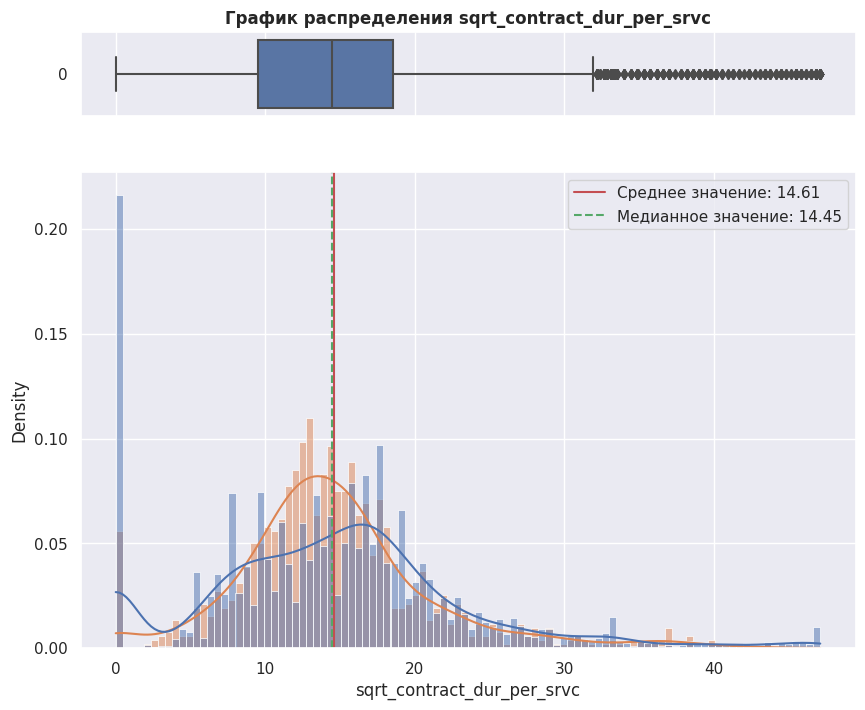

In [111]:
numeric_analysis(merged_df, 'sqrt_contract_dur_per_srvc', 'sqrt_contract_dur_per_srvc')

* Больше всего абонентов ушло с подключенными сервисами.
* В среднем у абонента подключено 3 сервиса.
* Выская доля абонентов подключает стримнговый сервис (ТВ, кино).

### Услуги телефонии

In [112]:
phone_df = pd.read_sql_query(phone_q, con = engine)

`phone` — информация об услугах телефонии

* customerID — ID пользователя;
* MultipleLines — подключение телефона к нескольким линиям одновременно

In [113]:
phone_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   CustomerId     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [114]:
phone_df.head()

,CustomerId,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


In [115]:
phone_df = phone_df.rename(columns={'CustomerId': 'customerID'})

In [116]:
merged_df = pd.merge(merged_df, phone_df, on='customerID', how='left')

In [117]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customerID                     7043 non-null   object        
 1   BeginDate                      7043 non-null   datetime64[ns]
 2   EndDate                        7043 non-null   object        
 3   Type                           7043 non-null   object        
 4   PaperlessBilling               7043 non-null   object        
 5   PaymentMethod                  7043 non-null   object        
 6   MonthlyCharges                 7043 non-null   float64       
 7   TotalCharges                   7043 non-null   float64       
 8   target                         7043 non-null   int64         
 9   contract_end_date              7043 non-null   datetime64[ns]
 10  contract_duration              7043 non-null   int64         
 11  begin_year       

In [118]:
for col in merged_df.columns:
    if merged_df[col].dtype == 'object' and merged_df[col].isna().any():
        merged_df[col].fillna('unknown', inplace=True)

In [119]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customerID                     7043 non-null   object        
 1   BeginDate                      7043 non-null   datetime64[ns]
 2   EndDate                        7043 non-null   object        
 3   Type                           7043 non-null   object        
 4   PaperlessBilling               7043 non-null   object        
 5   PaymentMethod                  7043 non-null   object        
 6   MonthlyCharges                 7043 non-null   float64       
 7   TotalCharges                   7043 non-null   float64       
 8   target                         7043 non-null   int64         
 9   contract_end_date              7043 non-null   datetime64[ns]
 10  contract_duration              7043 non-null   int64         
 11  begin_year       

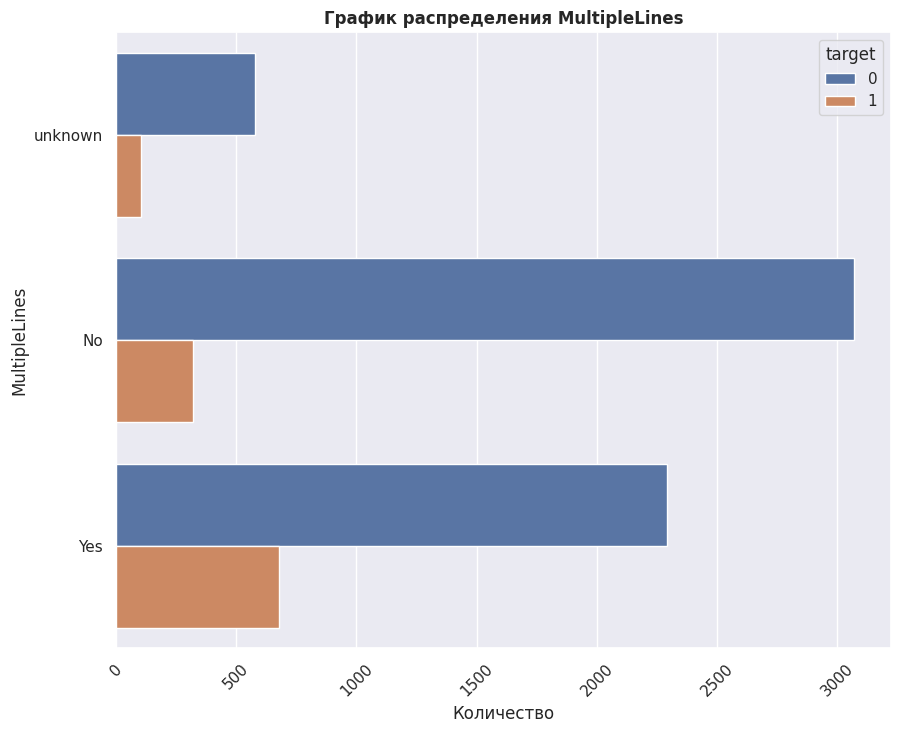

MultipleLines
No         3390
Yes        2971
unknown     682
Name: count, dtype: int64

In [120]:
cat_vis(merged_df, 'MultipleLines', 'target')

In [121]:
merged_df.columns

Index(['customerID', 'BeginDate', 'EndDate', 'Type', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'target',
       'contract_end_date', 'contract_duration', 'begin_year', 'begin_month',
       'begin_day', 'begin_weekday', 'begin_dayofyear', 'log_total_charges',
       'sqrt_total_charges', 'charge_per_day', 'gender', 'SeniorCitizen',
       'Partner', 'Dependents', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'service_count', 'total_charge_per_service',
       'monthly_charge_per_service', 'sqrt_total_charges_per_srvc',
       'sqrt_monthly_charges_per_srvc', 'contract_dur_per_srvc',
       'sqrt_contract_dur_per_srvc', 'MultipleLines'],
      dtype='object')

In [122]:
merged_df['charge_to_total_ratio'] = merged_df['MonthlyCharges'] / merged_df['TotalCharges']
merged_df['service_density'] = merged_df['service_count'] / merged_df['contract_duration']
merged_df['sqrt_total_charge_trend'] = merged_df['sqrt_total_charges'] * merged_df['contract_duration']
merged_df['m_charge_to_dur_ratio'] = merged_df['MonthlyCharges'] / merged_df['contract_duration']
merged_df['log_monthly_charges'] = np.log1p(merged_df['MonthlyCharges'])
merged_df['monthly_to_sqrt_total_ratio'] = merged_df['MonthlyCharges'] / (merged_df['sqrt_total_charges']**2 + 1e-6)
merged_df['charge_duration_interaction'] = merged_df['MonthlyCharges'] * merged_df['contract_duration']
merged_df['value_score'] = (merged_df['MonthlyCharges'] * merged_df['contract_duration']) / (merged_df['service_count'] + 1e-6)

count    7.043000e+03
mean     1.324388e+09
std      6.351986e+09
min      1.904333e+02
25%      7.932845e+03
50%      1.688775e+04
75%      2.933069e+04
max      1.041040e+11
Name: value_score, dtype: float64

Верхний ус: 61427.46 
Нижний ус: -24163.92     
Медианное значение: 16887.745778063556


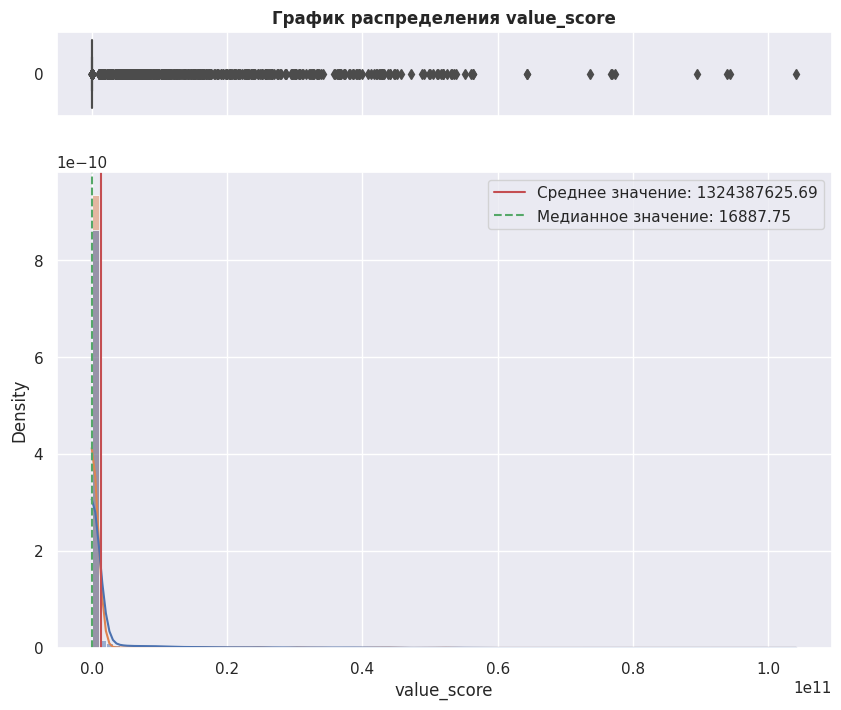

In [123]:
numeric_analysis(merged_df, 'value_score', 'value_score')

In [124]:
merged_df['log_value_score'] = np.log1p(merged_df['value_score'])

count    7043.000000
mean       10.657104
std         3.949018
min         5.254539
25%         8.978893
50%         9.734403
75%        10.286424
max        25.368656
Name: log_value_score, dtype: float64

Верхний ус: 12.25 
Нижний ус: 7.02     
Медианное значение: 9.734402748789003


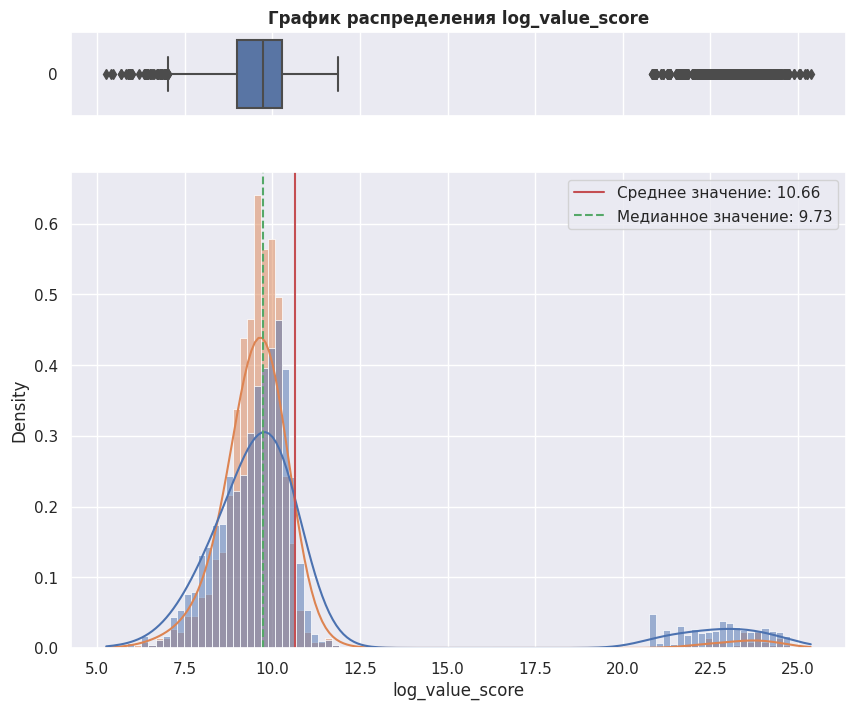

In [125]:
numeric_analysis(merged_df, 'log_value_score', 'log_value_score')

In [126]:
interval_cols = ['MonthlyCharges', 'TotalCharges', 'contract_duration', 'log_total_charges', 
                 'sqrt_total_charges', 'charge_per_day', 'total_charge_per_service',
                 'monthly_charge_per_service', 'sqrt_total_charges_per_srvc', 'sqrt_monthly_charges_per_srvc',
                 'charge_to_total_ratio', 'service_density', 'sqrt_total_charge_trend', 'm_charge_to_dur_ratio',
                 'log_monthly_charges', 'monthly_to_sqrt_total_ratio', 'charge_duration_interaction', 'value_score',
                 'log_value_score'
                ]

In [127]:
corr_plot = sns.pairplot(merged_df.sample(500), diag_kind='kde', vars=interval_cols, hue='target')
for axes in corr_plot.axes.flat:
    axes.set_ylabel(axes.get_ylabel(), rotation=60, horizontalalignment='right')
    axes.set_xlabel(axes.get_xlabel(), rotation=45)
plt.show()

## Коррецляционный анализ

In [128]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customerID                     7043 non-null   object        
 1   BeginDate                      7043 non-null   datetime64[ns]
 2   EndDate                        7043 non-null   object        
 3   Type                           7043 non-null   object        
 4   PaperlessBilling               7043 non-null   object        
 5   PaymentMethod                  7043 non-null   object        
 6   MonthlyCharges                 7043 non-null   float64       
 7   TotalCharges                   7043 non-null   float64       
 8   target                         7043 non-null   int64         
 9   contract_end_date              7043 non-null   datetime64[ns]
 10  contract_duration              7043 non-null   int64         
 11  begin_year       

In [129]:
cols_to_drop = ['customerID', 'BeginDate',
                'EndDate', 'begin_year',
                'begin_month', 'begin_day',
                'begin_weekday', 'begin_dayofyear', 
                'contract_end_date']

In [130]:
corr = merged_df.sample(500).drop(columns=cols_to_drop).phik_matrix(interval_cols=interval_cols)

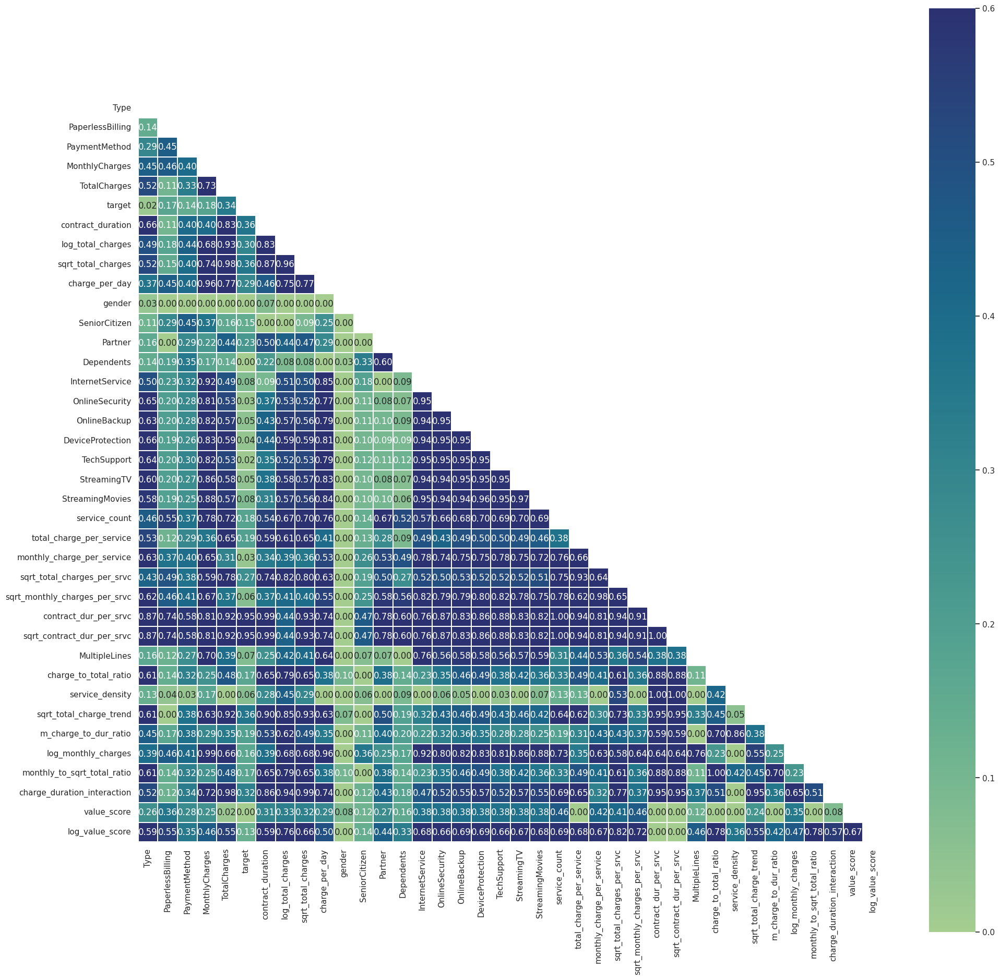

In [131]:
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.set_theme(style="white")
plt.figure(figsize=(23, 23))
cmap = sns.color_palette("crest", as_cmap=True)
sns.heatmap(corr, mask=mask, 
            square=True, 
            linewidths=.3,
            vmax=0.6,
        
            annot=True, 
            cmap=cmap, 
            fmt='.2f')

plt.show()

Присутствует корреляция в таких парах как:
* sqrt_total_charges - log_total_charges
* sqrt_total_charges - TotalCharges
* sqrt_total_charges_per_srvc - total_charge_per_service

Пока оставим эти признаки и введем регуляризацию.

## Подготовка данных и обучение модели

In [132]:
final_df = merged_df.drop(columns=cols_to_drop)

In [133]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Type                           7043 non-null   object 
 1   PaperlessBilling               7043 non-null   object 
 2   PaymentMethod                  7043 non-null   object 
 3   MonthlyCharges                 7043 non-null   float64
 4   TotalCharges                   7043 non-null   float64
 5   target                         7043 non-null   int64  
 6   contract_duration              7043 non-null   int64  
 7   log_total_charges              7043 non-null   float64
 8   sqrt_total_charges             7043 non-null   float64
 9   charge_per_day                 7043 non-null   float64
 10  gender                         7043 non-null   object 
 11  SeniorCitizen                  7043 non-null   object 
 12  Partner                        7043 non-null   o

### RandomForestClassifier

In [134]:
X = final_df.drop(columns='target')
y = final_df['target']

X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE,
                                                    stratify=y)

In [135]:
cat_cols = X_train_full.select_dtypes(exclude='number').columns.tolist()
num_cols = X_train_full.select_dtypes(include='number').columns.tolist()

In [ ]:
ohe_pipe = Pipeline(
    [
        (
            'Simple_imputer', 
            SimpleImputer(fill_value='no_active_services', strategy='constant', copy=False)
        ),
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
        )
    ]
) 

In [137]:
knn_pipe = Pipeline(
    [        
        ('KNNImputer', KNNImputer(n_neighbors=5, weights='distance')),
        ('Scaler', StandardScaler())
    ]
)

In [138]:
preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, cat_cols),
        ('knn', knn_pipe, num_cols)
    ], 
    remainder='passthrough'
) 

In [139]:
rf_pipe = Pipeline(
    [
        ('preprocessor', preprocessor),
        ('model', RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1))
    ]
)

In [140]:
rf_param_grid = [
    {
        'model__n_estimators': range(2, 256, 36),
        'model__max_depth': range(2, 16, 4),
        'model__min_samples_split': range(5, 20, 5),
        'model__min_samples_leaf': range(5, 20, 5),
        'model__criterion': ['gini', 'entropy'],
        'preprocessor__knn__Scaler': ['passthrough']
    }
]

In [141]:
rf_rndscv = RandomizedSearchCV(
    estimator=rf_pipe,
    param_distributions=rf_param_grid,
    scoring='roc_auc',
    n_jobs=-1,
    cv=3,
    random_state=RANDOM_STATE,)

In [142]:
rf_rndscv.fit(X_train_full, y_train_full)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('Simple_imputer',
                                                                                                SimpleImputer(copy=False,
                                                                                                              fill_value='unknown',
                                                                                                              strategy='constant')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['Type',
                                                                                'PaperlessBilling',
                                                                                'PaymentMe...
                                              RandomForestClassifier(n_jobs=-1,
                                                                     random_state=230425))]),
                   n_jobs=-1,
                   param_distributions=[{'model__criterion': ['gini',
                                                              'entropy'],
                                         'model__max_depth': range(2, 16, 4),
                                         'model__min_samples_leaf': range(5, 20, 5),
                                         'model__min_samples_split': range(5, 20, 5),
                                         'model__n_estimators': range(2, 256, 36),
                                         'preprocessor__knn__Scaler': ['passthrough']}],
                   random_state=230425, scoring='roc_auc')

In [143]:
pd.DataFrame(rf_rndscv.cv_results_).sort_values(by='rank_test_score').head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__knn__Scaler,param_model__n_estimators,param_model__min_samples_split,param_model__min_samples_leaf,param_model__max_depth,param_model__criterion,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
7,1.940714,0.061129,0.153210,0.021496,passthrough,146,5,10,14,entropy,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.836748,0.865942,0.834880,0.845857,0.014223,1
4,1.569652,0.040824,0.150426,0.029056,passthrough,110,10,10,10,entropy,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.837027,0.867521,0.831385,0.845311,0.015873,2
6,1.381658,0.099494,0.211464,0.029764,passthrough,110,10,5,10,gini,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.838055,0.863871,0.832860,0.844928,0.013561,3
3,0.581069,0.083868,0.136199,0.040966,passthrough,38,15,5,14,gini,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.830595,0.863219,0.825802,0.839872,0.016624,4
1,2.045175,0.255767,0.193693,0.026992,passthrough,182,5,10,14,gini,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.831073,0.861406,0.826184,0.839555,0.015580,5


In [144]:
rf_rndscv.best_params_

{'preprocessor__knn__Scaler': 'passthrough',
 'model__n_estimators': 146,
 'model__min_samples_split': 5,
 'model__min_samples_leaf': 10,
 'model__max_depth': 14,
 'model__criterion': 'entropy'}

In [145]:
f_importance = rf_rndscv.best_estimator_.named_steps['model'].feature_importances_
f_names = rf_rndscv.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

rf_feature_importance_df = pd.DataFrame({
    'Feature': f_names,
    'Importance': f_importance
}).sort_values(by='Importance', ascending=False)

In [146]:
rf_feature_importance_df.head(10)

,Feature,Importance
31,knn__charge_per_day,0.103628
28,knn__contract_duration,0.074127
39,knn__charge_to_total_ratio,0.058108
44,knn__monthly_to_sqrt_total_ratio,0.057966
41,knn__sqrt_total_charge_trend,0.045795
30,knn__sqrt_total_charges,0.044819
27,knn__TotalCharges,0.041421
43,knn__log_monthly_charges,0.038427
29,knn__log_total_charges,0.037976
45,knn__charge_duration_interaction,0.036481


### CatBoostClassifier

In [147]:
if get_gpu_device_count() > 0:
    cbc_pipe = Pipeline(
        [
            ('preprocessor', preprocessor),
            ('models', CatBoostClassifier(random_seed=RANDOM_STATE, logging_level='Silent', task_type='GPU'))
        ]
    )
else:
    cbc_pipe = Pipeline(
        [
            ('preprocessor', preprocessor),
            ('models', CatBoostClassifier(random_seed=RANDOM_STATE, logging_level='Silent', task_type='CPU'))
        ]
    )

In [148]:
cbc_param_grid = [
     {
        'models__iterations': [1000, 1500, 2000],
        'models__learning_rate': [0.01, 0.1, 0.3, 0.5],
        'models__depth': range(2, 8, 2),
        'models__random_strength': [1, 2, 3],
        'models__l2_leaf_reg': [1, 3, 5],
        'preprocessor__knn__Scaler': ['passthrough']         
    }
]

In [149]:
cbc_rndscv = RandomizedSearchCV(
    estimator=cbc_pipe,
    param_distributions=cbc_param_grid,
    scoring='roc_auc',
    n_jobs=1,
    cv=3,
    random_state=RANDOM_STATE)

In [150]:
cbc_rndscv.fit(X_train_full, y_train_full)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ohe',
                                                                               Pipeline(steps=[('Simple_imputer',
                                                                                                SimpleImputer(copy=False,
                                                                                                              fill_value='unknown',
                                                                                                              strategy='constant')),
                                                                                               ('ohe',
                                                                                                OneHotEncoder(drop='first',
                                                                                                              handle_unknown='ignore',
                                                                                                              sparse_output=False))]),
                                                                               ['Type',
                                                                                'PaperlessBilling',
                                                                                'PaymentMe...
                                             ('models',
                                              <catboost.core.CatBoostClassifier object at 0x7d1d6f9a2050>)]),
                   n_jobs=1,
                   param_distributions=[{'models__depth': range(2, 8, 2),
                                         'models__iterations': [1000, 1500,
                                                                2000],
                                         'models__l2_leaf_reg': [1, 3, 5],
                                         'models__learning_rate': [0.01, 0.1,
                                                                   0.3, 0.5],
                                         'models__random_strength': [1, 2, 3],
                                         'preprocessor__knn__Scaler': ['passthrough']}],
                   random_state=230425, scoring='roc_auc')

In [151]:
pd.DataFrame(cbc_rndscv.cv_results_).sort_values(by='rank_test_score').head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__knn__Scaler,param_models__random_strength,param_models__learning_rate,param_models__l2_leaf_reg,param_models__iterations,param_models__depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
8,32.671099,0.027745,0.093678,0.003318,passthrough,3,0.3,5,2000,4,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.916339,0.927795,0.912656,0.918930,0.006446,1
4,32.348621,0.251192,0.095140,0.001121,passthrough,2,0.1,3,2000,4,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.916692,0.928739,0.909990,0.918473,0.007757,2
3,22.067575,0.303032,0.092542,0.002995,passthrough,1,0.3,3,1500,2,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.915284,0.920805,0.909720,0.915270,0.004525,3
0,16.851836,0.295968,0.092323,0.003097,passthrough,2,0.3,5,1000,4,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.905596,0.924145,0.913991,0.914577,0.007584,4
1,49.115532,0.115468,0.098138,0.004425,passthrough,2,0.5,5,2000,6,"{'preprocessor__knn__Scaler': 'passthrough', '...",0.911562,0.919629,0.908464,0.913218,0.004706,5


In [152]:
cbc_rndscv.best_params_

{'preprocessor__knn__Scaler': 'passthrough',
 'models__random_strength': 3,
 'models__learning_rate': 0.3,
 'models__l2_leaf_reg': 5,
 'models__iterations': 2000,
 'models__depth': 4}

In [153]:
f_importance = cbc_rndscv.best_estimator_.named_steps['models'].feature_importances_
f_names = cbc_rndscv.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

feature_importance_df = pd.DataFrame({
    'Feature': f_names,
    'Importance': f_importance
}).sort_values(by='Importance', ascending=False)

In [154]:
feature_importance_df.head(10)

,Feature,Importance
31,knn__charge_per_day,22.626789
28,knn__contract_duration,15.770242
26,knn__MonthlyCharges,10.130923
39,knn__charge_to_total_ratio,9.087618
43,knn__log_monthly_charges,4.849001
42,knn__m_charge_to_dur_ratio,2.972308
45,knn__charge_duration_interaction,2.679553
1,ohe__Type_Two year,2.515811
40,knn__service_density,2.273329
44,knn__monthly_to_sqrt_total_ratio,2.195141


### Нейронная сеть

In [155]:
N_SPLITS = 3

In [156]:
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE)

In [157]:
nn_pipe = Pipeline(
    [
        ('preprocessor', preprocessor)
    ]
)

In [158]:
class ClassificationNet(nn.Module):
    def __init__(self, n_in_neurons, 
                 n_hidden_neurons_1, 
                 n_hidden_neurons_2,
                 n_out_neurons, 
                 dropout_rate_1=0.0, 
                 dropout_rate_2=0.0,
                 weight_init=nn.init.xavier_uniform_,
                ):
        super(ClassificationNet, self).__init__()

        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.dp1 = nn.Dropout(dropout_rate_1)
        
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.bn2 = nn.BatchNorm1d(n_hidden_neurons_2)
        self.act2 = nn.ReLU()
        self.dp2 = nn.Dropout(dropout_rate_2)
        
        self.fc5 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        self.act5 = nn.Sigmoid()
        
        weight_init(self.fc1.weight)
        weight_init(self.fc2.weight)


    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.dp1(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = self.act2(x)
        x = self.dp2(x)
        
        x = self.fc5(x)
        x = self.act5(x)
        
        return x

In [159]:
param_grid = {
    'weight_init': [nn.init.xavier_normal_, nn.init.xavier_uniform_,
                    nn.init.kaiming_normal_, nn.init.kaiming_uniform_],
    'module__dropout_rate_1': [0.1, 0.3],
    'module__dropout_rate_2': [0.1, 0.3],
    'max_epochs': [10000]
}

In [160]:
all_best_val_auc = []

In [161]:
for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_full, y_train_full)):
    
    best_val_bce = float('inf')
    best_val_auc = 0
    best_model_state = None  # Для сохранения весов лучшей модели

    bce_train_history = []
    bce_val_history = [] 

    best_params = None
    
    X_train_fold, X_val_fold = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
    y_train_fold, y_val_fold = y_train_full.iloc[train_idx], y_train_full.iloc[val_idx]
    
    X_train_transformed = nn_pipe.fit_transform(X_train_fold)
    X_val_transformed = nn_pipe.transform(X_val_fold)
    
    X_train_nn = torch.FloatTensor(X_train_transformed).to(device)
    X_val_nn = torch.FloatTensor(X_val_transformed).to(device)
    y_train_nn = torch.FloatTensor(y_train_fold.values).to(device)
    y_val_nn = torch.FloatTensor(y_val_fold.values).to(device)
    

    for num_epochs in param_grid['max_epochs']:
            for weight_init in param_grid['weight_init']:
                for dropout_rate_1 in param_grid['module__dropout_rate_1']:
                    for dropout_rate_2 in param_grid['module__dropout_rate_2']:
                                net_model = ClassificationNet(n_in_neurons=X_train_nn.shape[1],
                                            n_hidden_neurons_1=512, 
                                            n_hidden_neurons_2=8,
                                            n_out_neurons=1, 
                                            dropout_rate_1=dropout_rate_1,
                                            dropout_rate_2=dropout_rate_2,
                                            weight_init=weight_init
                                           ).to(device)

                                optimizer = torch.optim.Adam(net_model.parameters(), lr=1e-5, eps=1e-08)
                                loss = nn.BCELoss()

                                for epoch in range(num_epochs):
                                    order = np.random.permutation(len(X_train_nn))

                                    net_model.train()

                                    optimizer.zero_grad()

                                    X_shuffle = X_train_nn[order].to(device)
                                    y_shuffle = y_train_nn[order].to(device)

                                    preds = net_model.forward(X_shuffle).flatten()
                                    loss_value = loss(preds, y_shuffle)

                                    loss_value.backward()

                                    optimizer.step()

                                    if epoch % 200 == 0 or epoch == num_epochs - 1:
                                        net_model.eval()
                                        with torch.no_grad():
                                            val_preds = net_model.forward(X_val_nn).flatten()
                                            bce_loss = nn.BCELoss()
                                            bce_train = bce_loss(preds, y_shuffle)
                                            bce_val = bce_loss(val_preds, y_val_nn)

                                            bce_train_history.append(bce_train)
                                            bce_val_history.append(bce_val)

                                            y_val_np = y_val_nn.cpu().numpy()
                                            val_preds_np = val_preds.cpu().numpy()
                                            current_auc = roc_auc_score(y_val_np, val_preds_np)


                                            print(f'Epoch num: {epoch}\tTrain BCE: {bce_train.item():0.06f}\t' 
                                                  f'Val BCE: {bce_val.item():0.06f} Val AUC: {current_auc: 0.06f}\t'
                                                  f'Fold №: {fold + 1}'
                                                 )

                                            if bce_val < best_val_bce:
                                                best_val_bce = bce_val.item()
                                                best_val_auc = current_auc
                                                best_model_state = net_model.state_dict().copy()
                                                best_params = {
                                                    'weight_init': weight_init,
                                                    'dropout_rate_1': dropout_rate_1,
                                                    'dropout_rate_2': dropout_rate_2
                                                }
                                                
                                            elif (epoch > 500) and (bce_val > best_val_bce * 1.05) :
                                                break
                                            
                                            
    all_best_val_auc.append(best_val_auc)

Epoch num: 0	Train BCE: 0.670398	Val BCE: 0.718992 Val AUC:  0.525357	Fold №: 1
Epoch num: 200	Train BCE: 0.644361	Val BCE: 0.642799 Val AUC:  0.741958	Fold №: 1
Epoch num: 400	Train BCE: 0.628450	Val BCE: 0.627098 Val AUC:  0.787628	Fold №: 1
Epoch num: 600	Train BCE: 0.615993	Val BCE: 0.616584 Val AUC:  0.806972	Fold №: 1
Epoch num: 800	Train BCE: 0.608873	Val BCE: 0.608875 Val AUC:  0.819003	Fold №: 1
Epoch num: 1000	Train BCE: 0.602537	Val BCE: 0.602564 Val AUC:  0.827623	Fold №: 1
Epoch num: 1200	Train BCE: 0.595256	Val BCE: 0.597317 Val AUC:  0.832651	Fold №: 1
Epoch num: 1400	Train BCE: 0.591062	Val BCE: 0.592877 Val AUC:  0.836491	Fold №: 1
Epoch num: 1600	Train BCE: 0.585303	Val BCE: 0.588612 Val AUC:  0.839812	Fold №: 1
Epoch num: 1800	Train BCE: 0.581674	Val BCE: 0.584487 Val AUC:  0.842464	Fold №: 1
Epoch num: 2000	Train BCE: 0.576907	Val BCE: 0.580886 Val AUC:  0.845239	Fold №: 1
Epoch num: 2200	Train BCE: 0.574242	Val BCE: 0.576879 Val AUC:  0.847574	Fold №: 1
Epoch num: 

In [162]:
best_params

{'weight_init': <function torch.nn.init.xavier_normal_(tensor: torch.Tensor, gain: float = 1.0, generator: Optional[torch._C.Generator] = None) -> torch.Tensor>,
 'dropout_rate_1': 0.1,
 'dropout_rate_2': 0.1}

In [163]:
np.average(all_best_val_auc)

0.8989710033099488

In [164]:
print(f"RandomForestClassifier: {sorted(rf_rndscv.cv_results_['mean_test_score'], reverse=True)[0]}\n"
      f"CatBoostClassifier: {sorted(cbc_rndscv.cv_results_['mean_test_score'], reverse=True)[0]}\n"
      f"Нейронная сеть: {np.average(all_best_val_auc)}" 
     )

RandomForestClassifier: 0.845856521117598
CatBoostClassifier: 0.9189300939636006
Нейронная сеть: 0.8989710033099488


Лучшую метрику показал CatBoostClassifier

## Тестирование лучшей модели

In [165]:
best_model = cbc_rndscv.best_estimator_

In [166]:
cbc_preds_test = cbc_rndscv.predict(X_test)
cbc_proba_test = best_model.predict_proba(X_test)[:, 1]

In [167]:
roc_auc_score(y_test, cbc_proba_test)

0.926010033035605

In [168]:
accuracy_score(y_test, cbc_preds_test)

0.9051675184554231

 Модель на 90% верно классифицирует оставшихся и потенциально ушедших абонентов. 

In [169]:
dummy_model = DummyClassifier(strategy='stratified', random_state=RANDOM_STATE)
dummy_model.fit(X_train_full, y_train_full)

DummyClassifier(random_state=230425, strategy='stratified')

In [170]:
dummy_y = dummy_model.predict(X_test)
dummy_pred_y = dummy_model.predict_proba(X_test)[:, 1]

In [171]:
f1_dummy = f1_score(y_test, dummy_y)
roc_auc_dummy = roc_auc_score(y_test, dummy_pred_y)
pd.DataFrame(data=[f1_dummy, roc_auc_dummy], index=['f1_dummy', 'roc_auc_dummy'], columns=['score'])

,score
f1_dummy,0.158607
roc_auc_dummy,0.506914


Лучшая модель прошла тест на адекватность. 

In [172]:
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

In [173]:
X_test_preprocessed = best_model.named_steps['preprocessor'].transform(X_test)

In [174]:
explainer = shap.TreeExplainer(best_model.named_steps['models'])

In [175]:
shap_values = explainer(X_test_preprocessed)

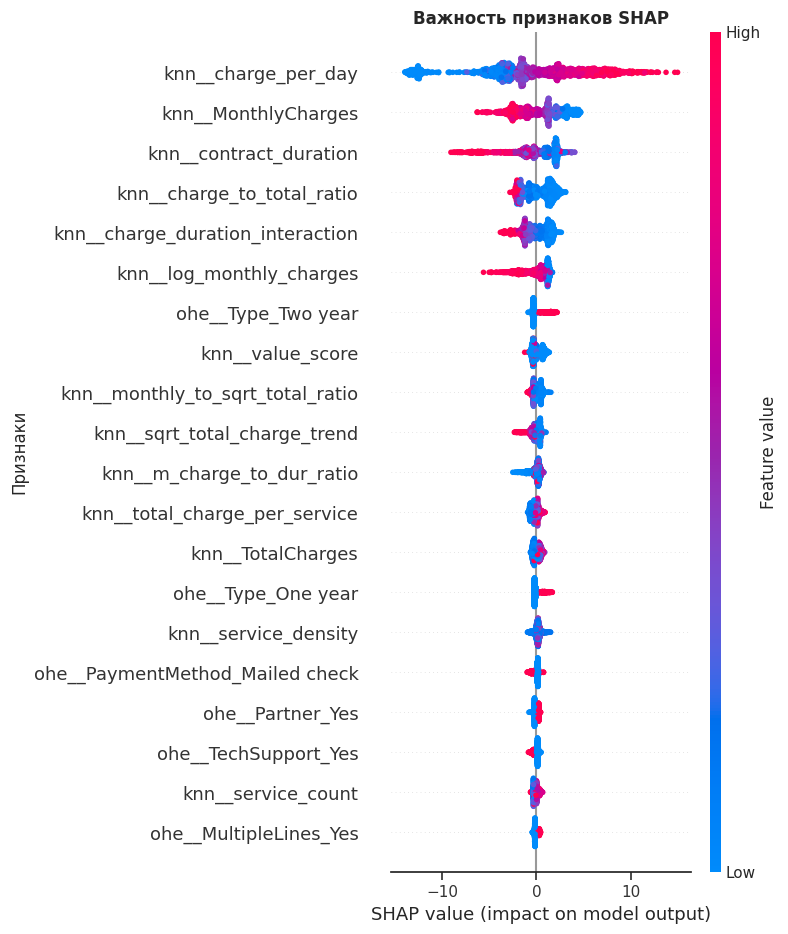

In [176]:
shap.summary_plot(shap_values, X_test_preprocessed, feature_names=feature_names, show=False)

plt.title("Важность признаков SHAP", weight='bold')
plt.ylabel('Признаки')
plt.tight_layout()
plt.show()

* Модель считает самым важным синтетический признак `charge_per_day` (сумма платежа / кол-во дней действия контракта). Чем выше плата, тем выше риск абонента расторгнуть контракт.
* Второй признак - ежемесячные траты. Низкие ежемясчные траты, также являются показателем того, что абонент может уйти.
* Интересно, что абоненты с подпиской на 2 года более склонны расторгнуть контракт.

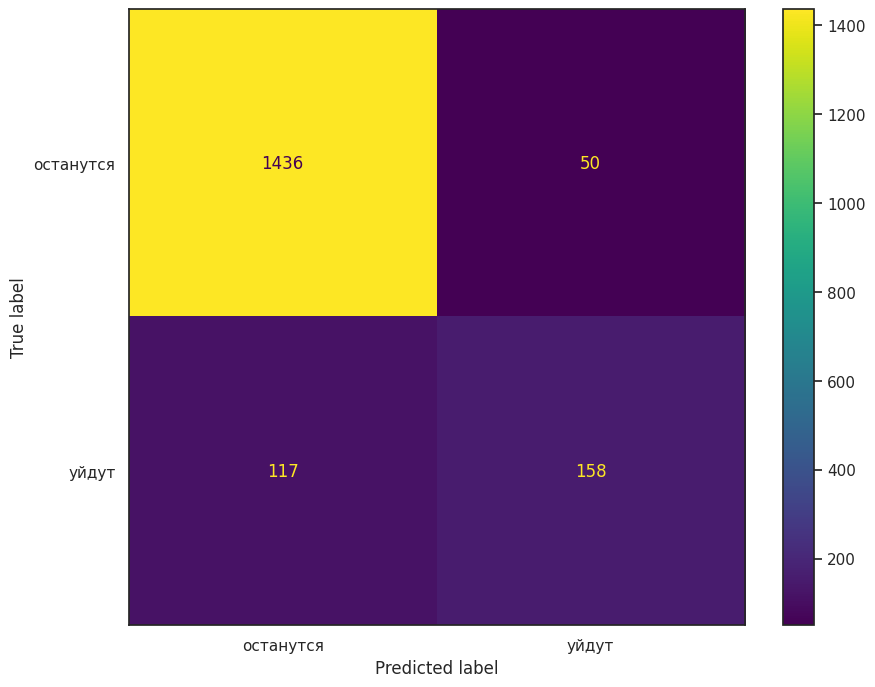

In [177]:
sns.set_theme(style="white")
cm = confusion_matrix(y_test, cbc_preds_test)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['останутся', 'уйдут'])
disp.plot()

plt.show()

* Модель верно определили 158 абонентов, которые потенциально могут уйти.
* При это модель неверно определила 50 абонента, которые на самом деле не склонны покинуть компанию.
* 117 абонентов модель ошибочно считает тех, кто может остаться.

In [178]:
print(f'Accuracy: {accuracy_score(y_test, cbc_preds_test)}\n'
      f'Recall: {recall_score(y_test, cbc_preds_test)}\n'
      f'Precision: {precision_score(y_test, cbc_preds_test)}\n'
      f'F1_score: {f1_score(y_test, cbc_preds_test)}')

Accuracy: 0.9051675184554231
Recall: 0.5745454545454546
Precision: 0.7596153846153846
F1_score: 0.6542443064182195


* Модель склонна относить абонентов, которые собираются уйти к остающимся (0.57).
* Модель относительно хорошо определяет всех абонентов, которые могут уйти (0.79).
* Модель на 90% верно классифицирует оставшихся и потенциально ушедших абонентов.
* F1=0.65 это метрика бенчмарк для нахождения баланса между строгим или щедящим режимом работы модели.   

count    7043.000000
mean        2.046466
std         1.023925
min         0.317500
25%         0.977678
50%         2.144209
75%         2.897938
max         4.154471
Name: charge_per_day, dtype: float64

Верхний ус: 5.78 
Нижний ус: -1.9     
Медианное значение: 2.1442089552238803


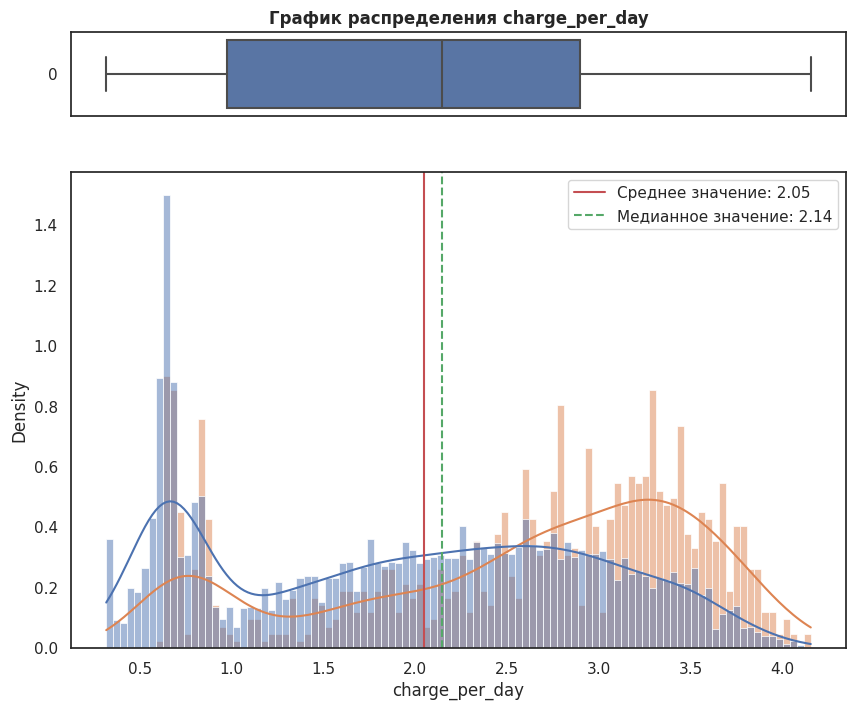

In [179]:
numeric_analysis(merged_df, 'charge_per_day', 'charge_per_day')

На графике видно два кластера, в которых ушедшие абоненты выделяются. 1) Высокие ежедневные оплаты; 2) Низкие платы. 

## Выводы

Цель настоящего проекта было создание модели для определения потенциальных абонентов, которые могу уйти.

В рамках настоящего проекта были выполнены следующие этапы:

1. Загрузка библиотек.
2. Загрузка данных.
3. Определение функций.
4. Исследовательский анализ.
5. Подготовка данных.
6. Обучение модели Случайный лес.
7. Обучение модели CatBoostClassifier
8. Обучение нейронной сети.
9. Тестирование лучшей модели.


Лучше всего показала себя **CatBoostClassifier** со следущими параметрами.

**ROC_AUC_SCORE** тестовые данные: 0.926

{'preprocessor__knn__Scaler': 'passthrough',
 'models__random_strength': 3,
 'models__learning_rate': 0.3,
 'models__l2_leaf_reg': 5,
 'models__iterations': 2000,
 'models__depth': 4}
    
| Параметры модели   | Значение       |
|--------------------|----------------|
| random_strength | 3            |
| learning_rate | 0.3              |
| l2_leaf_reg     | 5            |
| iterations     | 2000            |
| depth        | 4 |

**Важность признаков.**

* Модель считает самым важным синтетический признак `charge_per_day` (сумма платежа / кол-во дней действия контракта). Чем выше плата, тем выше риск абонента расторгнуть контракт.
* Второй признак - ежемесячные траты. Низкие ежемясчные траты, также являются показателем того, что абонент может уйти.
* Интересно, что абоненты с подпиской на 2 года более склонны расторгнуть контракт.
* Модель верно определили 158 абонентов, которые потенциально могут уйти.
* При это модель неверно определила 42 абонента, которые на самом деле не склонны покинуть компанию.
* 117 абонентов модель ошибочно считает тех, кто может остаться.

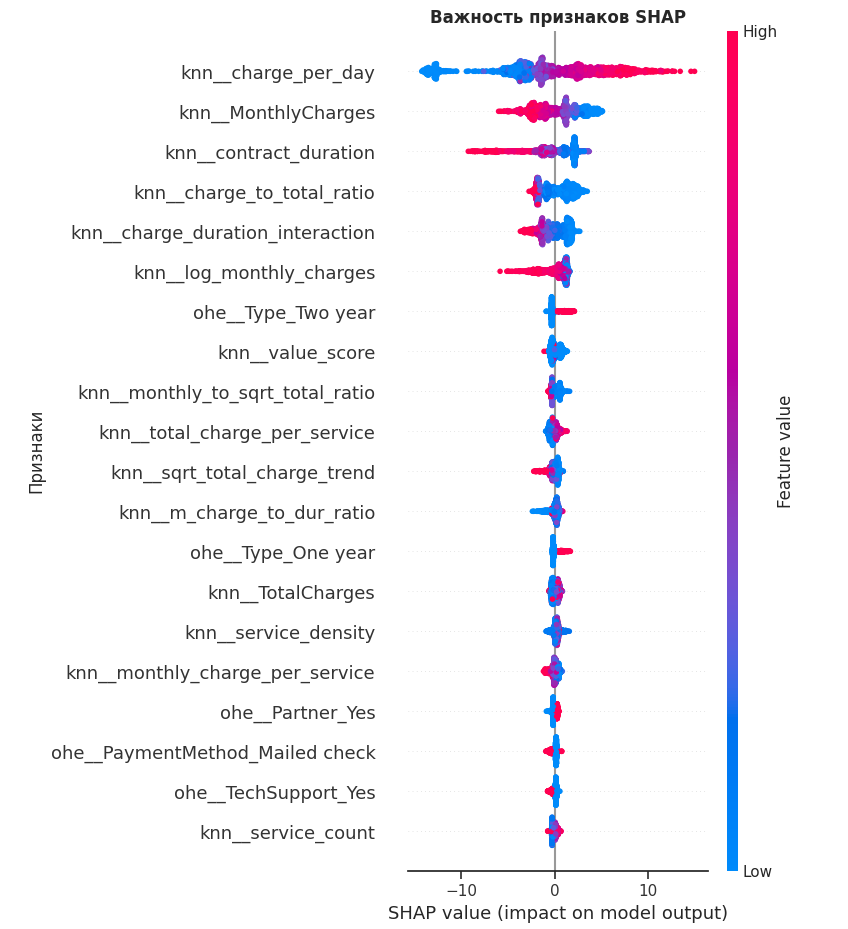

**Портрет ушедшого абоенет**.

* Ушедшие клиенты в среднем ежемесячно тратят больше, чем оставшиесь.

  
  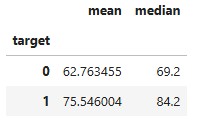
  
* Пол не влияет на показатель ушедших абонентов.
* Абонентов с супргом/супргой ушло больше, что логично, так как если один член семьи меняет оператора, то переводит к нему всю семью.
* В среденем ушедшие абоненты подкючили себе 4-5 сервиса. Этот показатель выше чем у оставшихся - 3.

**Рекомендации**.
* В первую очередь предлагать скидки на ежемесяные платежи и/или ввести кэшбек систему абонентам, которые потенциально могут уйти. Чем дольше абонент платит, тем выше скидка/кэшбек.
* Провести опросу по стриминговому контенту или расширить контент без значительного повышения цены. Это может также привлечь существующих абонентов.
* Провести анализ и разработать модель, которая будет прогнозировать уход абонента после воздействия на него маркетинговой компанией. Могло так получиться, что из-за навязчивой рекламы могли побудить абонента уйти или напомнить ему, что он собирался уйти. Другими словами, дальше оптимизировать маркетинговые мероприятия.


[Вернуться в начало тетрадки](#head)